

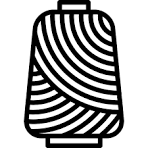

# ***Global Yarn Price Forecasting Using ML Models (LSTM Variants, GRU and TFT):***


---


# **Environment & Package Setup**

In [ ]:
# =========================================================
#  INSTALL Darts (for Temporal Fusion Transformer)
# =========================================================
!pip -q uninstall -y numpy pmdarima u8darts torch torchvision torchaudio >/dev/null 2>&1

# ✅ Core dependencies
!pip -q install "numpy==1.26.4" "scipy==1.11.4" "pandas==2.1.4"

# ✅ Compatible pmdarima build
!pip -q install "pmdarima==2.0.4"

# ✅ Darts + PyTorch (CPU version)
!pip -q install "u8darts[torch]==0.30.0" "torch==2.2.2" "torchvision==0.17.2" "torchaudio==2.2.2"

import os
print("✅ Darts + Torch installed. Restarting runtime …")
os.kill(os.getpid(), 9)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 147.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 126.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.2.0 requires torch>=1.11.0, which is not installed.
accelerate 1.12.0 requires torch>=2.0.0, which is not installed.
fastai 2.8.6 requires torch<2.10,>=1.10, which is not installed.
fastai 2.8.6 requires torchvision>=0.11, which is not installed.
peft 0.18.0 requires torch>=1.13.0, which is not installed.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.1.4 which is incompatible.
ope

In [1]:
# ============ 1) Setup & Install ============

import os,io,re,glob,ast,warnings,itertools #System & Utilities
import numpy as np, pandas as pd #Numerical & Data Handling
import matplotlib.pyplot as plt,matplotlib.dates as mdates, seaborn as sns #Plotting
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import ipywidgets as widgets #Widgets
from IPython.display import display, clear_output

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_regression
from sklearn.inspection import permutation_importance
from sklearn.metrics import (
    r2_score,
    mean_squared_error,
    mean_absolute_error
)

import tensorflow as tf
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.layers import (
    Input, Dense, Dropout, LSTM, GRU, Bidirectional,
    Conv1D, MaxPooling1D
)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
warnings.filterwarnings("ignore")

from xgboost import XGBRegressor, plot_importance

from darts import TimeSeries
from darts.models import TFTModel
from darts.dataprocessing.transformers import Scaler
from darts.metrics import mape, rmse


# ============================================================
# CORE NOTEBOOK CONFIGURATION & UTILITY FUNCTIONS
# ============================================================

try:
    from google.colab import files as colab_files
    _COLAB = True
except Exception:
    _COLAB = False
    raise RuntimeError("Please run this notebook in Google Colab.")

# --- Global Random Seed Configuration ---
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ---  Forecasting & Model Hyperparameters ---
FORECAST_FROM      = "2025-05-01"
REQ_TEST_MIN_PTS   = 20
REQ_TRAIN_MIN_PTS  = 60
MAX_SEQ_DAILY      = 30
MAX_SEQ_WEEKLY     = 10
FORECAST_HORIZON   = 60

MODEL_LIST   = ["LSTM", "GRU", "CNN-LSTM", "BiLSTM", "AttnBiLSTM"]
LR           = 1e-3
EPOCHS       = 250
BATCH        = 8
PATIENCE_ES  = 18
PATIENCE_RL  = 8

# --- File & Path Utilities ---

def _safe_name(x) -> str:
    """
    Sanitize a string for filenames:
    keep letters, digits, dot, dash, underscore.
    """
    return re.sub(r'[^A-Za-z0-9._-]+', '_', str(x))

def get_metrics_csv_path(freq, market, subp, results_dir="/content/results"):
    """
    Return the exact metrics CSV path; if not found,
    a safe glob fallback is used.
    """
    safe_market = _safe_name(market)
    safe_subp   = _safe_name(subp)

    expected = os.path.join(
        results_dir,
        f"metrics_{freq}_{safe_market}_{safe_subp}.csv"
    )

    if os.path.exists(expected):
        return expected

    # fallback: pick the latest matching file
    cand = sorted(
        glob.glob(os.path.join(results_dir, f"metrics_{freq}_{safe_market}_*.csv"))
    )
    if cand:
        return cand[-1]

    raise FileNotFoundError(
        f"Metrics CSV not found. Expected {expected} or "
        f"metrics_{freq}_{safe_market}_*.csv in {results_dir}"
    )


# **Data Loading**

In [2]:
# ============ 2) File Uploads ============
def _read_any_uploaded(uploaded_dict, friendly_name):
    if not uploaded_dict:
        raise ValueError(f"No file uploaded for {friendly_name}.")
    fname = list(uploaded_dict.keys())[0]
    blob  = uploaded_dict[fname]
    name  = fname.lower()
    if name.endswith((".xlsx",".xls")):
        try:
            df = pd.read_excel(io.BytesIO(blob))
        except Exception:
            df = pd.read_excel(io.BytesIO(blob), engine="openpyxl")
    else:
        df = None
        for enc in (None,"utf-8","utf-8-sig","cp1252","latin-1"):
            try:
                df = pd.read_csv(io.BytesIO(blob)) if enc is None else pd.read_csv(io.BytesIO(blob), encoding=enc)
                break
            except Exception:
                pass
        if df is None:
            df = pd.read_excel(io.BytesIO(blob))
    print(f"✅ Uploaded {friendly_name}: {fname} (shape={df.shape})")
    display(df.head(3))
    return df, fname

print("📎 Upload YARN PRICE file (contains Market / Sub Product / Price and Exchange Rate):")
yarn_df, yarn_fname = _read_any_uploaded(colab_files.upload(), "Yarn")

print("\n📎 Upload RAW COTTON PRICE file:")
cot_df, _ = _read_any_uploaded(colab_files.upload(), "Raw cotton")

print("\n📎 Upload CRUDE OIL PRICE file:")
oil_df, _ = _read_any_uploaded(colab_files.upload(), "Crude oil")

print("\n📎 Upload LABOUR COST file:")
lab_df, _ = _read_any_uploaded(colab_files.upload(), "Labour cost")

📎 Upload YARN PRICE file (contains Market / Sub Product / Price and Exchange Rate):


Saving 30_1_Combed_Knitting_Yarn_Asia_FOB_North_India_30_1_Combed_Knitting_Yarn_Asia_Domestic_North_India_Cotton_Yarn_Daily_Price_Trend_from_02_Jan_2023_to__131428 (1).xlsx to 30_1_Combed_Knitting_Yarn_Asia_FOB_North_India_30_1_Combed_Knitting_Yarn_Asia_Domestic_North_India_Cotton_Yarn_Daily_Price_Trend_from_02_Jan_2023_to__131428 (1).xlsx
✅ Uploaded Yarn: 30_1_Combed_Knitting_Yarn_Asia_FOB_North_India_30_1_Combed_Knitting_Yarn_Asia_Domestic_North_India_Cotton_Yarn_Daily_Price_Trend_from_02_Jan_2023_to__131428 (1).xlsx (shape=(5080, 8))


,Report Time,Value,Unit,% Change,Product Name,Sub Product,Market,Exchange Rate
0,2025-06-06,2.91,USD/Kg,0.00,Knitting Yarn,30/1 Combed,Domestic North India,INR: 0.01164446
1,2025-06-05,2.91,USD/Kg,-0.34,Knitting Yarn,30/1 Combed,Domestic North India,INR: 0.01164103
2,2025-06-04,2.92,USD/Kg,-0.34,Knitting Yarn,30/1 Combed,Domestic North India,INR: 0.01166738



📎 Upload RAW COTTON PRICE file:


Saving Intrnational Raw Cotton Prices.csv to Intrnational Raw Cotton Prices.csv
✅ Uploaded Raw cotton: Intrnational Raw Cotton Prices.csv (shape=(628, 7))


,Date,Raw_Cotton_Price,Open,High,Low,Vol.,Change %
0,7/3/2025,68.46,68.65,68.97,68.21,15.47K,-0.25%
1,7/2/2025,68.63,68.03,68.74,67.96,16.35K,0.88%
2,7/1/2025,68.03,68.15,68.75,67.87,22.88K,-0.15%



📎 Upload CRUDE OIL PRICE file:


Saving Crude Oil Prices.csv to Crude Oil Prices.csv
✅ Uploaded Crude oil: Crude Oil Prices.csv (shape=(629, 2))


,Date,Oil_Price
0,6/30/2025,68.15
1,6/27/2025,69.37
2,6/26/2025,68.57



📎 Upload LABOUR COST file:


Saving Labour Cost.xlsx to Labour Cost.xlsx
✅ Uploaded Labour cost: Labour Cost.xlsx (shape=(29, 2))


,Date,Labour_Cost
0,2023-01-01,192.809
1,2023-02-01,190.793
2,2023-03-01,192.352


# **Preprocessing & Merging**

In [3]:
# ============ 3) Preprocessing & Merging ============

# ==============================
# 3.1 Date Handling and Indexing
# ==============================
def to_datetime_index(df: pd.DataFrame):
    """Pick a date-like column or the first column as datetime index; sort."""
    if isinstance(df.index, pd.DatetimeIndex):
        return df.sort_index()
    cands = [c for c in df.columns if any(k in c.lower() for k in ["date","time","report"])]
    col = cands[0] if cands else df.columns[0]
    df[col] = pd.to_datetime(df[col], errors="coerce")
    df = df.dropna(subset=[col]).set_index(col)
    return df.sort_index()

def collapse_duplicate_dates(df: pd.DataFrame):
    """Average numeric columns; keep last for cats when duplicates exist."""
    if not df.index.has_duplicates: return df
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    agg = {c:"mean" for c in num_cols}
    for c in df.columns:
        if c not in num_cols: agg[c] = "last"
    return df.groupby(level=0, sort=True).agg(agg)

# ==============================
# 3.2 Numeric Cleaning Utilities
# ==============================

def _num_from_text(series):
    return pd.to_numeric(series.astype(str).str.extract(r'([-+]?[0-9]*\.?[0-9]+)')[0], errors="coerce")

# ==============================
# 3.3 Dataset-Specific Formatting
# ==============================

def tidy_yarn(df: pd.DataFrame):
    """
    Keep Market & Sub Product; rename price to Yarn_price; extract FX numeric from same file.
    ALSO: populate Unit='USD/KG' and Product Name='Knitting yarn'.
    """
    df = to_datetime_index(df).copy()
    lc = {c.lower(): c for c in df.columns}

    # Normalize segment headers
    if "market" in lc and lc["market"] != "Market":
        df = df.rename(columns={lc["market"]:"Market"})
    if "sub product" in lc and lc["sub product"] != "Sub Product":
        df = df.rename(columns={lc["sub product"]:"Sub Product"})
    if "sub_product" in lc and lc["sub_product"] != "Sub Product":
        df = df.rename(columns={lc["sub_product"]:"Sub Product"})

    # Detect price column
    price_col = None
    for c in df.columns:
        if ("price" in c.lower()) or ("value" in c.lower()):
            price_col = c; break
    if price_col is None:
        # fallback: most-complete numeric
        nn = df.select_dtypes(include=[np.number]).notna().sum().sort_values(ascending=False)
        price_col = nn.index[0]
    df = df.rename(columns={price_col:"Yarn_price"})

    # Extract exchange rate numeric from available columns
    fx_col = None
    for c in df.columns:
        cl = c.lower()
        if any(k in cl for k in ["exchange","fx","usd/inr","inr/usd","forex"]):
            fx_col = c; break
    if fx_col is not None:
        fx_num = _num_from_text(df[fx_col])
        df["exchange_rate_numeric"] = fx_num

    # Standardize types
    for c in df.columns:
        if c in ["Market","Sub Product"]:
            df[c] = df[c].astype(str).str.strip()
        elif df[c].dtype == object:
            df[c] = _num_from_text(df[c])

    #  Unit + Product Name <<<
    df["Unit"] = "USD/KG"
    df["Product Name"] = "Knitting yarn"

    return df.sort_index()

def tidy_factor(df: pd.DataFrame, name: str):
    df = to_datetime_index(df).copy()
    num_cols = df.select_dtypes(include=[np.number]).columns
    if len(num_cols)==0:
        # parse numbers from text
        cand = df.columns[1] if df.shape[1]>1 else df.columns[0]
        vals = _num_from_text(df[cand])
        return df.assign(_val=vals)[["_val"]].rename(columns={"_val":name}).dropna()
    # choose densest numeric
    col = df[num_cols].notna().sum().sort_values(ascending=False).index[0]
    return df[[col]].rename(columns={col:name})

def weekly_resample_keep_segments(df, rule="W-FRI"):
    df = collapse_duplicate_dates(df)
    nums = df.select_dtypes(include=[np.number]).columns.tolist()
    cats = [c for c in df.columns if c not in nums]
    a = df[nums].resample(rule).mean() if nums else None
    b = df[cats].resample(rule).last() if cats else None
    out = pd.concat([a,b], axis=1) if a is not None and b is not None else (a or b)
    return out.ffill().bfill()

# ==============================
# 3.4 Reindexing and Frequency Handling
# ==============================

def daily_fill(df):
    df = collapse_duplicate_dates(df)
    idx = pd.date_range(df.index.min(), df.index.max(), freq="D")
    return df.reindex(idx).ffill().bfill()

# ==============================
# 3.5 Dataset Preparation and Merging
# ==============================

# Build merged datasets
yarn = tidy_yarn(yarn_df)
cot  = tidy_factor(cot_df, "raw_cotton_price")
oil  = tidy_factor(oil_df, "oil_price")
lab  = tidy_factor(lab_df, "labour_cost")

merged = yarn.join([oil, cot, lab], how="left").ffill().bfill().sort_index()
merged_daily  = daily_fill(merged)
merged_weekly = weekly_resample_keep_segments(merged)


merged.head(5)

,Yarn_price,Unit,% Change,Product Name,Sub Product,Market,Exchange Rate,exchange_rate_numeric,oil_price,raw_cotton_price,labour_cost
2023-01-02,3.54,USD/KG,0.0,Knitting yarn,40/1 Carded,FOB China,1.000000,1.000000,80.36,83.14,190.793
2023-01-02,3.72,USD/KG,0.0,Knitting yarn,40/2 Carded,Domestic China,0.144967,0.144967,80.36,83.14,190.793
2023-01-02,3.74,USD/KG,0.0,Knitting yarn,40/1 Combed,FOB China,1.000000,1.000000,80.36,83.14,190.793
2023-01-02,3.66,USD/KG,0.0,Knitting yarn,40/1 Combed,Domestic China,0.144967,0.144967,80.36,83.14,190.793
2023-01-02,3.44,USD/KG,0.0,Knitting yarn,40/1 Carded,Domestic China,0.144967,0.144967,80.36,83.14,190.793


# **Factor Relevance Assessment**

 Analysing factor importance using  — Which factors most influence Yarn Price?
Correlation matrix (selected factors):


,Yarn_price,labour_cost,oil_price,raw_cotton_price,exchange_rate_numeric
Yarn_price,1.000,0.434,0.596,0.797,0.608
labour_cost,0.434,1.000,-0.151,0.281,0.321
oil_price,0.596,-0.151,1.000,0.602,0.030
raw_cotton_price,0.797,0.281,0.602,1.000,0.329
exchange_rate_numeric,0.608,0.321,0.030,0.329,1.000


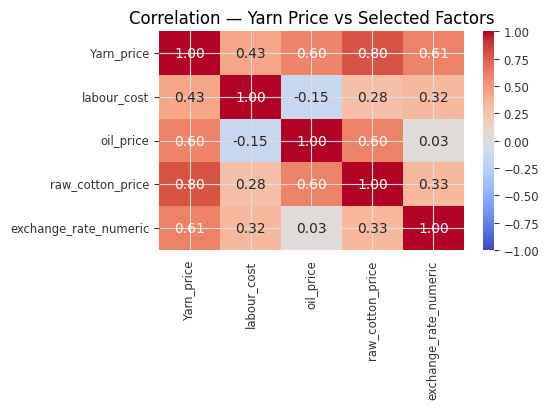

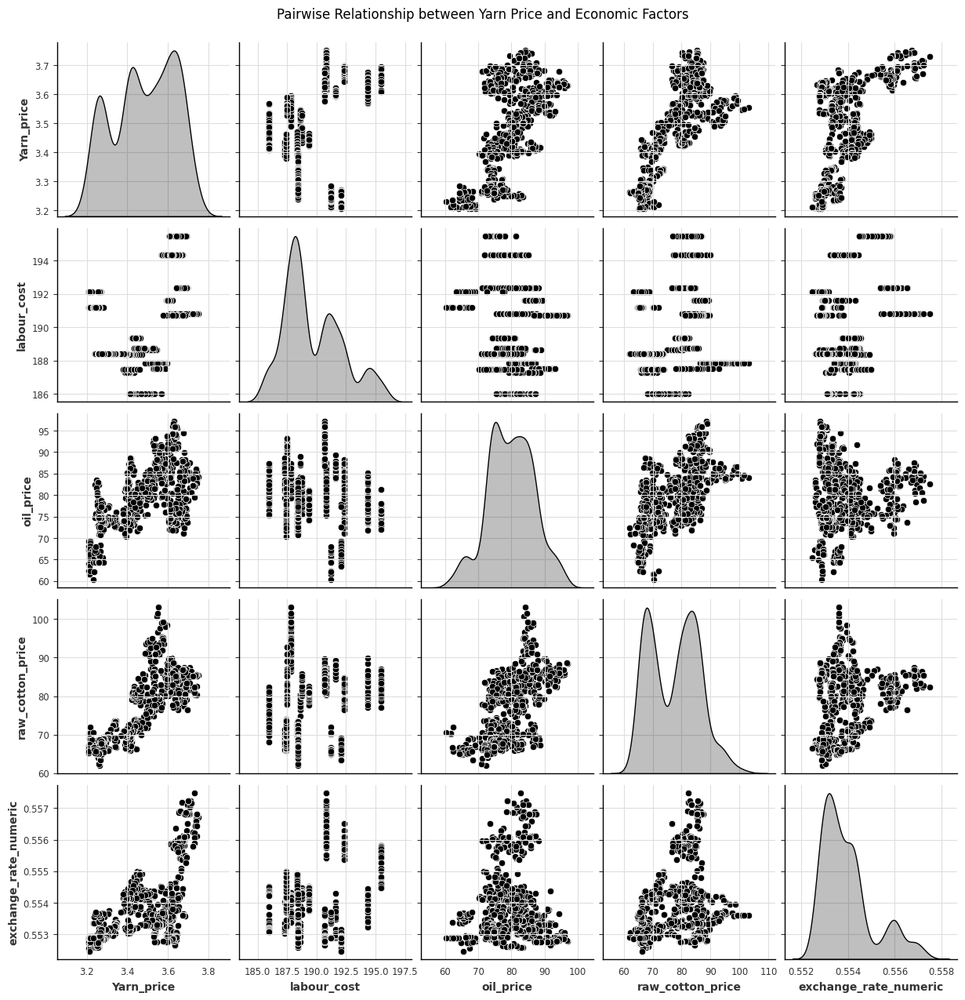

Combined feature-importance summary (selected factors):


,Correlation_with_Yarn,Mutual_Information
raw_cotton_price,0.7965,1.2608
exchange_rate_numeric,0.6080,1.3900
oil_price,0.5962,1.0548
labour_cost,0.4344,1.6561


In [4]:
# ============  4) Factor Importance to Yarn Price ============

print(" Analysing factor importance using  — Which factors most influence Yarn Price?")

# --- Select variables ---
target_col = "Yarn_price"
feature_cols = ["labour_cost", "oil_price", "raw_cotton_price", "exchange_rate_numeric"]

# --- Build dataset from merged_daily (assumed to exist from earlier cells) ---
df = merged_daily.copy()

# Keep only available/valid columns
feature_cols = [c for c in feature_cols if c in df.columns]
cols = [target_col] + feature_cols
df = df[cols].replace([np.inf, -np.inf], np.nan).ffill().bfill().dropna()

X = df[feature_cols]
y = df[target_col]

# --- Train/test split  ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False, random_state=42
)

# ==============================================================
# 4.1 Correlation (linear relationship context)
# ==============================================================
corr_matrix = df[[target_col] + feature_cols].corr()

print("Correlation matrix (selected factors):")
display(corr_matrix.round(3))

plt.figure(figsize=(5.6, 4.2))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)
plt.title("Correlation — Yarn Price vs Selected Factors")
plt.tight_layout()
plt.show()

sns.pairplot(
    merged_daily[["Yarn_price", "labour_cost", "oil_price", "raw_cotton_price", "exchange_rate_numeric"]],
    diag_kind="kde"
)
plt.suptitle("Pairwise Relationship between Yarn Price and Economic Factors", y=1.02)
plt.show()

# ==============================================================
# 4.2 Mutual Information (nonlinear dependency)
# ==============================================================
mi = mutual_info_regression(X_train, y_train, random_state=42)
mi_series = pd.Series(mi, index=feature_cols).sort_values(ascending=True)

# ==============================================================
# 4.3 Combined summary
# ==============================================================
summary = (
    pd.DataFrame({
        "Correlation_with_Yarn": corr_matrix.loc[feature_cols, target_col],
        "Mutual_Information": mi_series.reindex(feature_cols),
    })
    .sort_values("Correlation_with_Yarn", ascending=False)
)

print("Combined feature-importance summary (selected factors):")
display(summary.round(4))



# **Outlier Capping**

Applying Z-score capping per (Market, Sub Product) ...
Box plots — Daily (before vs after)


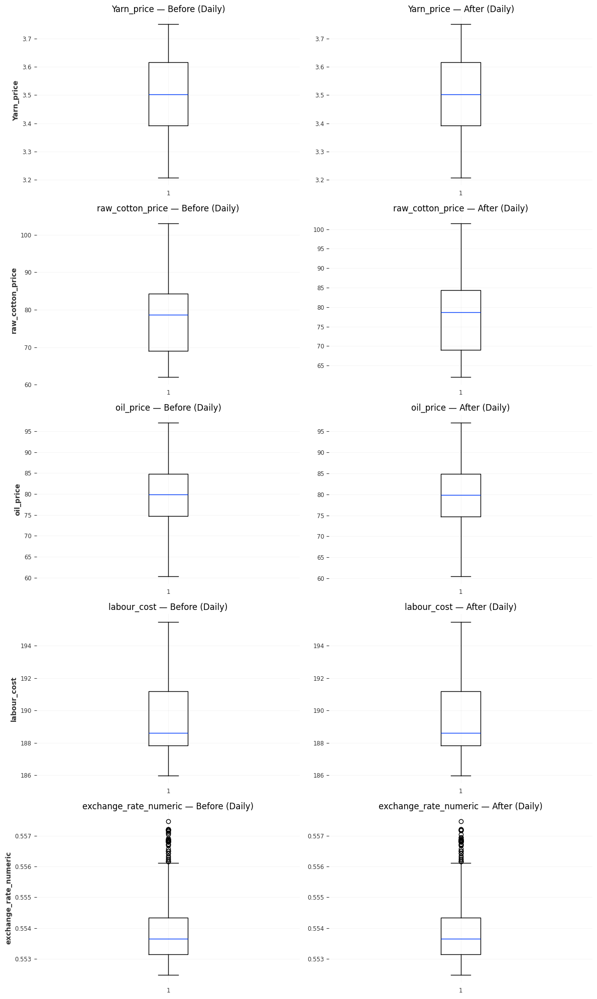

 Outlier Capping Summary Table


,Column,Before Min,After Min,Before Max,After Max,Before Mean,After Mean,Std Dev Before,Std Dev After
0,Yarn_price,3.207500,3.207500,3.751250,3.751250,3.484827,3.484827,0.149962,0.149962
1,raw_cotton_price,62.040000,62.040000,101.560000,101.560000,77.469780,77.469780,8.504128,8.504128
2,oil_price,60.493330,60.493330,97.100000,97.100000,79.800804,79.800804,6.921836,6.921836
3,labour_cost,185.980000,185.980000,195.483000,195.483000,189.703469,189.703469,2.456244,2.456244
4,exchange_rate_numeric,0.552471,0.552471,0.557483,0.557483,0.553961,0.553961,0.001102,0.001102


In [5]:
# ============ 4) Outlier Capping (Z-score) + Box Plots ============
# cap outliers per (Market, Sub Product) group using Z-scores:
# x_capped = clip(x, μ - Z_MAX*σ, μ + Z_MAX*σ)

Z_MAX = 3.0
KEY_NUM_COLS = [c for c in ["Yarn_price","raw_cotton_price","oil_price","labour_cost","exchange_rate_numeric"] if c in merged_daily.columns]

def zcap_groupwise(df: pd.DataFrame, group_cols=("Market","Sub Product"), num_cols=KEY_NUM_COLS, zmax=Z_MAX):
    if not num_cols:
        return df.copy(), {}
    df = df.copy()
    caps = {}
    # Compute μ, σ per group and cap
    def _cap_group(g):
        for c in num_cols:
            s = pd.to_numeric(g[c], errors="coerce")
            mu = s.mean(); sd = s.std(ddof=0)
            if pd.isna(mu) or sd is None or sd == 0:
                continue
            lower = mu - zmax*sd; upper = mu + zmax*sd
            g[c] = s.clip(lower=lower, upper=upper)
            caps.setdefault(c, []).append((lower, upper))
        return g
    if all(col in df.columns for col in group_cols):
        df = df.groupby(list(group_cols), group_keys=False, dropna=False).apply(_cap_group)
    else:
        df = _cap_group(df)
    return df, caps

def _boxplot_before_after(df_before: pd.DataFrame, df_after: pd.DataFrame, title_suffix="(Daily)"):
    cols = [c for c in KEY_NUM_COLS if c in df_before.columns]
    if not cols:
        print("⚠️ No numeric columns to plot for box plots."); return
    import math
    n = len(cols)
    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(12, 4*n))
    if n == 1:
        axes = np.array([axes])  # shape (1,2)

    for i, c in enumerate(cols):
        # Before
        axes[i,0].boxplot(pd.to_numeric(df_before[c], errors="coerce").dropna().values, vert=True)
        axes[i,0].set_title(f"{c} — Before {title_suffix}")
        axes[i,0].set_ylabel(c)
        axes[i,0].grid(alpha=0.25)
        # After
        axes[i,1].boxplot(pd.to_numeric(df_after[c], errors="coerce").dropna().values, vert=True)
        axes[i,1].set_title(f"{c} — After {title_suffix}")
        axes[i,1].grid(alpha=0.25)
    plt.tight_layout()
    plt.show()

print("Applying Z-score capping per (Market, Sub Product) ...")
# Daily
merged_daily_capped, _caps_daily = zcap_groupwise(merged_daily)


print("Box plots — Daily (before vs after)")
_boxplot_before_after(merged_daily, merged_daily_capped, title_suffix="(Daily)")

# Use the capped datasets for all downstream steps (UI, modeling, etc.)
merged_daily  = merged_daily_capped


# =========================================
# 4.1 SUMMARY TABLE FOR OUTLIER CAPPING
# =========================================

summary_rows = []
for col in KEY_NUM_COLS:
    before = pd.to_numeric(merged_daily[col], errors="coerce")
    after = pd.to_numeric(merged_daily_capped[col], errors="coerce")

    summary_rows.append({
        "Column": col,
        "Before Min": before.min(),
        "After Min": after.min(),
        "Before Max": before.max(),
        "After Max": after.max(),
        "Before Mean": before.mean(),
        "After Mean": after.mean(),
        "Std Dev Before": before.std(),
        "Std Dev After": after.std()
    })

summary_table = pd.DataFrame(summary_rows)
print(" Outlier Capping Summary Table")
summary_table

# **Check Missing Values in Cleansed data set**


In [6]:
# ============ 5) Quality Tables (Missing & Availability) ============
def missing_table(df: pd.DataFrame) -> pd.DataFrame:
    out = pd.DataFrame({
        "missing_count": df.isna().sum(),
        "missing_pct": (df.isna().sum()/len(df))*100.0,
        "dtype": df.dtypes.astype(str)
    }).sort_values(by="missing_count", ascending=False)
    return out

def segment_coverage_table(df: pd.DataFrame) -> pd.DataFrame:
    if not set(["Market","Sub Product"]).issubset(df.columns):
        return pd.DataFrame()
    rows = []
    for (m, s), g in df.groupby(["Market","Sub Product"]):
        rows.append({
            "Market": m, "Sub Product": s,
            "start": g.index.min().date(), "end": g.index.max().date(),
            "rows": len(g), "has_fx": int("exchange_rate_numeric" in g.columns and g["exchange_rate_numeric"].notna().any()),
            "has_oil": int(g["oil_price"].notna().any()) if "oil_price" in g.columns else 0,
            "has_cotton": int(g["raw_cotton_price"].notna().any()) if "raw_cotton_price" in g.columns else 0,
            "has_labour": int(g["labour_cost"].notna().any()) if "labour_cost" in g.columns else 0,
        })
    return pd.DataFrame(rows).sort_values(["Market","Sub Product"]).reset_index(drop=True)

print(" Missing table (Daily merged)")
display(missing_table(merged_daily))
print("\n Segment coverage table (Daily merged)")
display(segment_coverage_table(merged_daily))

 Missing table (Daily merged)


,missing_count,missing_pct,dtype
Yarn_price,0,0.0,float64
% Change,0,0.0,float64
Exchange Rate,0,0.0,float64
exchange_rate_numeric,0,0.0,float64
oil_price,0,0.0,float64
raw_cotton_price,0,0.0,float64
labour_cost,0,0.0,float64
Unit,0,0.0,object
Product Name,0,0.0,object
Sub Product,0,0.0,object



 Segment coverage table (Daily merged)


,Market,Sub Product,start,end,rows,has_fx,has_oil,has_cotton,has_labour
0,Domestic China,40/1 Carded,2023-01-09,2025-05-25,105,1,1,1,1
1,Domestic China,40/1 Combed,2023-01-19,2025-05-04,126,1,1,1,1
2,Domestic China,40/2 Carded,2023-01-03,2025-05-18,115,1,1,1,1
3,Domestic North India,30/1 Combed,2023-02-02,2025-06-06,109,1,1,1,1
4,FOB China,40/1 Carded,2023-01-04,2025-06-02,99,1,1,1,1
5,FOB China,40/1 Combed,2023-01-05,2025-06-03,110,1,1,1,1
6,FOB China,40/2 Carded,2023-01-02,2025-06-05,113,1,1,1,1
7,FOB North India,30/1 Combed,2023-01-06,2025-05-27,110,1,1,1,1


# **Normalized Plot with all Factors**

In [7]:
# ============ 6) Overview Plot (Normalized) ============
def _plot_overview_normalized(df_seg: pd.DataFrame, title: str):
    cand = ["Yarn_price","raw_cotton_price","oil_price","labour_cost","exchange_rate_numeric"]
    cols = [c for c in cand if c in df_seg.columns]
    if not cols:
        print("⚠️ No columns to plot."); return

    def _mm(s):
        s = pd.to_numeric(s, errors="coerce").ffill().bfill()
        mn, mx = s.min(), s.max()
        if pd.isna(mn) or pd.isna(mx) or mx==mn:
            return pd.Series(np.full(len(s), 0.5), index=s.index)
        return (s - mn)/(mx - mn)

    norm = pd.DataFrame(index=df_seg.index)
    for c in cols: norm[c] = _mm(df_seg[c])

    fig, ax = plt.subplots(figsize=(14,5))
    for c in norm.columns:
        ax.plot(norm.index, norm[c], label=c)
    ax.set_title(title); ax.set_xlabel("Date"); ax.set_ylabel("Normalized value")
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
    ax.grid(alpha=0.3); ax.legend(ncols=2)
    plt.tight_layout(); plt.show()

# **Forecasting Pipeline**

In [8]:
# ============ 7) Modeling ============

# ==========================
# 7.1 SPLITTING & SEQUENCES
# ==========================
def pick_test_start_dynamic(idx: pd.DatetimeIndex, desired=FORECAST_FROM,
                            req_test=REQ_TEST_MIN_PTS, req_train=REQ_TRAIN_MIN_PTS):
    ds = pd.to_datetime(desired)
    if idx.max() < ds:  # all before desired
        ds = idx.max() - pd.Timedelta(days=max(21, req_test))
        return max(idx.min(), ds)

    n_after  = int((idx >= ds).sum())
    n_before = int((idx < ds).sum())
    if n_after < req_test:  ds = ds - pd.Timedelta(days=(req_test - n_after))
    if n_before < req_train: ds = ds + pd.Timedelta(days=(req_train - n_before))
    return min(max(idx.min(), ds), idx.max())

def choose_seq_len(n_train, freq="Daily"):
    cap = MAX_SEQ_DAILY if freq=="Daily" else MAX_SEQ_WEEKLY
    return int(max(5, min(cap, round(0.2 * n_train))))

def make_supervised(X, y, seq_len):
    Xs, ys = [], []
    for i in range(len(y)-seq_len):
        Xs.append(X[i:i+seq_len, :])
        ys.append(y[i+seq_len])
    return np.array(Xs), np.array(ys)

# =========================
# 7.2 MODEL ARCHITECTURES
# =========================
def build_lstm(shape, lr=LR):
    m = Sequential([Input(shape=shape), LSTM(128, return_sequences=True), Dropout(0.2),
                    LSTM(64), Dense(1)])
    m.compile(optimizer=Adam(lr), loss="mse"); return m
def build_gru(shape, lr=LR):
    m = Sequential([Input(shape=shape), GRU(128, return_sequences=True), Dropout(0.2),
                    GRU(64), Dense(1)])
    m.compile(optimizer=Adam(lr), loss="mse"); return m
def build_cnn_lstm(shape, lr=LR):
    m = Sequential([Input(shape=shape), Conv1D(64,3,activation='relu'), MaxPooling1D(2),
                    LSTM(64), Dense(1)])
    m.compile(optimizer=Adam(lr), loss="mse"); return m
def build_bilstm(shape, lr=LR):
    m = Sequential([Input(shape=shape), Bidirectional(LSTM(96, return_sequences=True)), Dropout(0.3),
                    Bidirectional(LSTM(48)), Dense(1)])
    m.compile(optimizer=Adam(lr), loss="mse"); return m
class TemporalAttention(layers.Layer):
    def __init__(self, units=64, **kw): super().__init__(**kw); self.W1=layers.Dense(units); self.W2=layers.Dense(1)
    def call(self, x): s=tf.nn.tanh(self.W1(x)); w=tf.nn.softmax(self.W2(s),axis=1); return tf.reduce_sum(w*x,axis=1)
def build_attn_bilstm(shape, lr=LR):
    inp = Input(shape=shape)
    x   = Bidirectional(LSTM(128, return_sequences=True))(inp)
    x   = Dropout(0.3)(x)
    x   = Bidirectional(LSTM(64, return_sequences=True))(x)
    c   = TemporalAttention(64)(x)
    out = Dense(1)(c)
    m = Model(inp, out); m.compile(optimizer=Adam(lr), loss="mse"); return m

def get_model(name, shape):
    return {"LSTM":build_lstm, "GRU":build_gru, "CNN-LSTM":build_cnn_lstm,
            "BiLSTM":build_bilstm, "AttnBiLSTM":build_attn_bilstm}[name](shape)

# ==============================
# 7.3 FACTOR & SEGMENT FILTERS
# ==============================

def factor_cols_available(df):
    return [c for c in ["oil_price","raw_cotton_price","labour_cost","exchange_rate_numeric"] if c in df.columns]

def filter_segment(d_daily, d_weekly, market_val, subp_val, freq="Daily"):
    base = d_weekly if freq=="Weekly" else d_daily
    out  = base.copy()
    out  = out[out["Market"].astype(str).str.strip() == str(market_val).strip()]
    if "Sub Product" in out.columns and subp_val and subp_val!="ALL":
        out = out[out["Sub Product"].astype(str).str.strip() == str(subp_val).strip()]
    out = out.dropna(subset=["Yarn_price"])
    return out

# ==============================
# 7.4 METRICS & VISUALIZATION
# ==============================

def metrics(y_true, y_pred):
    y_true = np.asarray(y_true).ravel(); y_pred = np.asarray(y_pred).ravel()
    mse  = mean_squared_error(y_true, y_pred); rmse = mse**0.5
    mae  = mean_absolute_error(y_true, y_pred)
    r2   = r2_score(y_true, y_pred)
    mape = float(np.mean(np.abs((y_true - y_pred)/(y_true + 1e-9))) * 100.0)
    return dict(R2=r2, MSE=mse, RMSE=rmse, MAE=mae, MAPE=mape)

def plot_forecast(df_full, target_col, test_from, dates_pred, y_true, y_pred, title):
    fig, ax = plt.subplots(figsize=(14,6))
    ax.plot(df_full.index, df_full[target_col], color="gray", alpha=0.6, label="Actual (full)")
    ax.axvspan(pd.to_datetime(test_from), df_full.index.max(), color="orange", alpha=0.10, label="Forecast window")
    ax.plot(dates_pred, y_true, color="black", lw=2, marker="o", label="Actual (test)")
    ax.plot(dates_pred, y_pred, color="#1f77b4", lw=2, ls="--", marker="x", label="Forecast")
    ax.set_title(title); ax.set_ylabel(target_col); ax.set_xlabel("Date")
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%b-%Y"))
    ax.grid(alpha=0.3); ax.legend()
    plt.tight_layout(); plt.show()



In [9]:
# ============ 8) Unified Training + Forecasting Runner ============

# Output area used by the runner AND by the UI in Segment 9
out = widgets.Output()

@out.capture(clear_output=True)
def on_run(_):
    market_val = dd_market.value
    subp_val   = dd_subprod.value
    freq       = "Daily"   # fixed to Daily (no Weekly toggle)

    df_seg = filter_segment(merged_daily, merged_weekly, market_val, subp_val, freq)
    if df_seg.empty:
        print("No data for selection.")
        return

    # Overview normalized plot
    _plot_overview_normalized(df_seg, f"Normalized Key Series — {subp_val} / {market_val}")

    # Robust split & seq_len
    test_start = pick_test_start_dynamic(
        df_seg.index, FORECAST_FROM, REQ_TEST_MIN_PTS, REQ_TRAIN_MIN_PTS
    )
    train_df = df_seg[df_seg.index < test_start].copy()
    test_df  = df_seg[df_seg.index >= test_start].copy()

    if len(train_df) < 30 or len(test_df) < 10:
        # fallback split (last 25% as test)
        cut = int(len(df_seg) * 0.75)
        train_df = df_seg.iloc[:cut]
        test_df  = df_seg.iloc[cut:]
        test_start = test_df.index.min()
        if len(train_df) < 30 or len(test_df) < 10:
            print("Not enough rows even after fallback.")
            return

    seq_len = choose_seq_len(len(train_df), freq=freq)
    print(
        f"Split — Train: {len(train_df)} | Test: {len(test_df)} "
        f"| seq_len={seq_len} | Start={test_start.date()}"
    )

    # Feature sets
    available_factors = factor_cols_available(df_seg)
    all_results = []

    def run_one(model_name, factors):
        use_cols = list(dict.fromkeys(factors + ["Yarn_price"]))  # keep order
        X_tr = train_df[use_cols].astype(float).values
        X_te = test_df[use_cols].astype(float).values
        y_tr = train_df[["Yarn_price"]].astype(float).values
        y_te = test_df[["Yarn_price"]].astype(float).values

        Xsc = MinMaxScaler()
        ysc = MinMaxScaler()
        X_trs = Xsc.fit_transform(X_tr)
        X_tes = Xsc.transform(X_te)
        y_trs = ysc.fit_transform(y_tr).ravel()
        y_tes = ysc.transform(y_te).ravel()

        X_full = np.vstack([X_trs, X_tes])
        y_full = np.concatenate([y_trs, y_tes])
        X_seq, y_seq = make_supervised(X_full, y_full, seq_len)

        split_idx = len(X_trs) - seq_len
        if split_idx <= 2 or split_idx >= len(X_seq):
            raise ValueError("Sequence split misalignment (too little train vs seq_len).")

        n_train_seq = split_idx
        n_val = max(1, int(0.15 * n_train_seq))
        tr_end = max(1, n_train_seq - n_val)

        X_trq, y_trq = X_seq[:tr_end], y_seq[:tr_end]
        X_val, y_val = X_seq[tr_end:split_idx], y_seq[tr_end:split_idx]
        X_tesq, y_tesq = X_seq[split_idx:], y_seq[split_idx:]

        tf.keras.backend.clear_session()
        model = get_model(model_name, (X_trq.shape[1], X_trq.shape[2]))
        es = EarlyStopping(monitor="val_loss", patience=PATIENCE_ES, restore_best_weights=True)
        rl = ReduceLROnPlateau(monitor="val_loss", patience=PATIENCE_RL,
                               factor=0.5, min_lr=1e-5, verbose=0)
        model.fit(
            X_trq, y_trq,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            batch_size=BATCH,
            verbose=0,
            shuffle=False,
            callbacks=[es, rl],
        )

        # Walk-forward with observed exogenous rows
        win = X_full[len(X_trs) - seq_len : len(X_trs), :].copy()
        preds = []
        horizon = min(FORECAST_HORIZON, len(test_df))
        for t in range(horizon):
            p_s = model.predict(win[np.newaxis, ...], verbose=0).ravel()[0]
            p   = ysc.inverse_transform([[p_s]]).ravel()[0]
            preds.append(p)
            # next observed feature row if available
            if seq_len + t < X_full.shape[0]:
                nx = X_full[len(X_trs) + t]
            else:
                nx = win[-1].copy()
            win = np.vstack([win[1:], nx])

        pred_dates = test_df.index[:len(preds)]
        y_true = test_df["Yarn_price"].values[:len(preds)]
        m = metrics(y_true, preds)
        title = (
            f"{model_name} — {freq} | "
            f"{'Univariate' if not factors else 'Price + ' + ', '.join(factors)}"
        )
        plot_forecast(
            df_seg[["Yarn_price"]],
            "Yarn_price",
            test_start,
            pred_dates,
            y_true,
            preds,
            title,
        )
        return {
            "Market": market_val,
            "Sub Product": subp_val,
            "Freq": freq,
            "Model": model_name,
            "Features": (
                "Univariate" if not factors else "Price + " + ", ".join(factors)
            ),
            **m,
        }

    # ---- Univariate (price only)
    for mname in MODEL_LIST:
        print(f"\n— UNIVARIATE: {mname} —")
        try:
            all_results.append(run_one(mname, []))
        except Exception as e:
            print("Skipped:", e)

    # ---- Multivariate (all combinations of available factors)
    facs = available_factors
    if facs:
        combos = []
        for r in range(1, len(facs) + 1):
            combos += list(itertools.combinations(facs, r))
        for comb in combos:
            for mname in MODEL_LIST:
                print(f"\n— MULTIVARIATE: {mname} — {list(comb)} —")
                try:
                    all_results.append(run_one(mname, list(comb)))
                except Exception as e:
                    print("Skipped:", e)
    else:
        print("\nℹ️ No factor columns available for this segment; multivariate skipped.")

    # ---- Summary & export ----
    if all_results:
        res = (
            pd.DataFrame(all_results)
            .sort_values(by=["RMSE", "MAPE", "MSE"])
            .reset_index(drop=True)
        )
        print("\n================ SUMMARY (sorted by RMSE/MAPE) ================")
        display(res)
        results_dir = "/content/results"
        os.makedirs(results_dir, exist_ok=True)

        safe_market = _safe_name(market_val)
        safe_subp   = _safe_name(subp_val)
        out_csv = os.path.join(results_dir, f"metrics_{freq}_{safe_market}_{safe_subp}.csv")

        res.to_csv(out_csv, index=False)
        print(f"💾 Saved metrics → {out_csv}")
    else:
        print("No results to summarize.")


In [10]:
# ============ 9) Segment Filter UI (Daily Only) ============

def _safe_unique(df, col):
    """Return clean unique values for dropdown widgets."""
    if col not in df.columns:
        return ["ALL"]
    s = df[col].astype(str).str.strip()
    s = s.replace({"nan": "", "None": "", "NaT": ""})
    s = s[s != ""]
    vals = sorted(s.unique().tolist())
    return vals if vals else ["ALL"]


markets = _safe_unique(merged_daily, "Market")
subs    = _safe_unique(merged_daily, "Sub Product")

dd_market = widgets.Dropdown(
    options=markets,
    description="Market:",
    layout=widgets.Layout(width="40%"),
)

dd_subprod = widgets.Dropdown(
    options=subs,
    description="Sub Product:",
    layout=widgets.Layout(width="40%"),
)

btn_run = widgets.Button(
    description="Run Forecasts",
    button_style="success",
    layout=widgets.Layout(width="25%"),
)

# Display controls and shared output area from Segment 8
display(widgets.HBox([dd_market, dd_subprod, btn_run]))
display(out)

# Wire button to the runner defined in Segment 8
btn_run.on_click(on_run)


Output()

# **Hyperparameter tuning for the best models**

In [12]:
# ============ 11) Hyperparameter Tuning (Best Univariate & Multivariate) ============

# ==============================
# 11.1 HELPERS
# ==============================

def get_metrics_csv_path(market, subp, results_dir="/content/results"):
    """
    Locate the metrics CSV produced in Segment 8.
    Segment 8 saves: metrics_Daily_<market>_<subp>.csv
    """
    safe_m = _safe_name(market)
    safe_s = _safe_name(subp)

    expected = f"{results_dir}/metrics_Daily_{safe_m}_{safe_s}.csv"
    if os.path.exists(expected):
        return expected

    # Fallback: any metrics_* file for this market
    fallback = sorted(glob.glob(f"{results_dir}/metrics_*_{safe_m}_*.csv"))
    if fallback:
        return fallback[-1]

    raise FileNotFoundError(
        f"Metrics CSV missing for market={market}, subp={subp}"
    )


def _parse_features_cell(cell):
    if not isinstance(cell, str):
        return []
    s = cell.strip().lower()
    if s == "univariate":
        return []
    if s.startswith("price +"):
        return [x.strip() for x in cell.split("+", 1)[1].split(",")]
    return []


def _fmt_metrics_line(m: dict) -> str:
    """Pretty printer for all metrics in a single consistent line."""
    # Use .get to avoid KeyError if a metric is missing
    return (
        f"R2={m.get('R2', np.nan):.3f} | "
        f"MSE={m.get('MSE', np.nan):.4f} | "
        f"RMSE={m.get('RMSE', np.nan):.4f} | "
        f"MAE={m.get('MAE', np.nan):.4f} | "
        f"MAPE={m.get('MAPE', np.nan):.2f}%"
    )


# ==============================
# 11.2 TUNING GRIDS
# ==============================

TUNE_GRIDS = {
    "LSTM":       {"lr": [1e-3, 5e-4], "batch": [8, 16]},
    "GRU":        {"lr": [1e-3, 5e-4], "batch": [8, 16]},
    "CNN-LSTM":   {"lr": [1e-3, 5e-4], "batch": [8, 16]},
    "BiLSTM":     {"lr": [1e-3, 5e-4], "batch": [8, 16]},
    "AttnBiLSTM": {"lr": [1e-3, 5e-4], "batch": [8, 16]},
}
TUNE_EPOCHS = min(EPOCHS, 80)

def _iter_grid(grid):
    keys = list(grid.keys())
    vals = [grid[k] for k in keys]
    for combo in itertools.product(*vals):
        yield dict(zip(keys, combo))


# ==============================
# 11.3 PREPARE SPLITS FOR TUNING
# ==============================

def _prepare_splits_for_tuning(df_seg, factors):
    """
    Build train/val/test sequences for tuning using the same logic
    as Segment 8 (Daily only).
    """
    test_start = pick_test_start_dynamic(
        df_seg.index, FORECAST_FROM, REQ_TEST_MIN_PTS, REQ_TRAIN_MIN_PTS
    )
    train_df = df_seg[df_seg.index < test_start].copy()
    test_df  = df_seg[df_seg.index >= test_start].copy()

    if len(train_df) < 30 or len(test_df) < 10:
        cut = int(len(df_seg) * 0.75)
        train_df = df_seg.iloc[:cut].copy()
        test_df  = df_seg.iloc[cut:].copy()
        test_start = test_df.index.min()
        if len(train_df) < 30 or len(test_df) < 10:
            raise ValueError("Insufficient rows for tuning.")

    # Daily only
    seq_len = choose_seq_len(len(train_df), freq="Daily")

    use_cols = list(dict.fromkeys((factors or []) + ["Yarn_price"]))
    X_tr = train_df[use_cols].astype(float).values
    X_te = test_df[use_cols].astype(float).values
    y_tr = train_df[["Yarn_price"]].values
    y_te = test_df[["Yarn_price"]].values

    Xsc = MinMaxScaler()
    ysc = MinMaxScaler()
    X_trs = Xsc.fit_transform(X_tr)
    X_tes = Xsc.transform(X_te)
    y_trs = ysc.fit_transform(y_tr).ravel()
    y_tes = ysc.transform(y_te).ravel()

    X_full = np.vstack([X_trs, X_tes])
    y_full = np.concatenate([y_trs, y_tes])
    X_seq, y_seq = make_supervised(X_full, y_full, seq_len)

    split_idx = len(X_trs) - seq_len
    if split_idx <= 2 or split_idx >= len(X_seq):
        raise ValueError("Sequence split misalignment.")

    n_train_seq = split_idx
    n_val = max(1, int(0.15 * n_train_seq))
    tr_end = max(1, n_train_seq - n_val)

    X_trq  = X_seq[:tr_end]
    y_trq  = y_seq[:tr_end]
    X_val  = X_seq[tr_end:split_idx]
    y_val  = y_seq[tr_end:split_idx]
    X_tesq = X_seq[split_idx:]
    y_tesq = y_seq[split_idx:]

    pred_dates = test_df.index[:len(X_tesq)]
    y_true = test_df["Yarn_price"].values[:len(X_tesq)]

    return {
        "df_seg": df_seg,
        "test_start": test_start,
        "seq_len": seq_len,
        "use_cols": use_cols,
        "X_trs": X_trs,
        "X_trq": X_trq,
        "y_trq": y_trq,
        "X_val": X_val,
        "y_val": y_val,
        "X_tesq": X_tesq,
        "y_tesq": y_tesq,
        "ysc": ysc,
        "pred_dates": pred_dates,
        "y_true": y_true,
    }


# ==============================
# 11.4 PLOTTING (always tuned-style)
# ==============================

def plot_best_model_graph(df_seg, pred_dates, y_true, y_pred, title, m):
    """Always use the 'tuned' visual style, for tuned or baseline models."""
    fig, ax = plt.subplots(figsize=(18, 4))

    ax.plot(
        df_seg.index, df_seg["Yarn_price"],
        color="black", lw=1.3, label="Actual (full)"
    )
    ax.axvspan(
        pred_dates[0], pred_dates[-1],
        color="orange", alpha=0.13, label="Forecast window"
    )
    ax.plot(
        pred_dates, y_true, "o-", color="tab:orange",
        lw=1.4, label="Actual (test)"
    )
    ax.plot(
        pred_dates, y_pred, "-", color="tab:blue",
        lw=1.8, label="Forecast"
    )

    ax.set_title(
        f"{title}  |  MAPE={m['MAPE']:.2f}%  RMSE={m['RMSE']:.4f}",
        fontsize=13, weight="bold"
    )
    ax.set_ylabel("Yarn Price (USD/kg)")
    ax.set_xlabel("Date")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower left", fontsize=9)
    plt.tight_layout()
    plt.show()


# ==============================
# 11.5 RE-FIT BASELINE MODEL (for plotting if tuning worse)
# ==============================

def _refit_baseline_for_plot(model_name, factors, df_seg):
    """
    Re-fit baseline model with original hyperparameters (global LR, BATCH)
    using the same splitting logic as tuning, purely for plotting.
    """
    splits = _prepare_splits_for_tuning(df_seg, factors)
    shape = (splits["X_trq"].shape[1], splits["X_trq"].shape[2])

    tf.keras.backend.clear_session()
    model = get_model(model_name, shape)  # uses global LR
    es = EarlyStopping(monitor="val_loss", patience=PATIENCE_ES,
                       restore_best_weights=True)
    rl = ReduceLROnPlateau(monitor="val_loss", patience=PATIENCE_RL,
                           factor=0.5, min_lr=1e-5, verbose=0)

    model.fit(
        splits["X_trq"], splits["y_trq"],
        validation_data=(splits["X_val"], splits["y_val"]),
        epochs=EPOCHS,
        batch_size=BATCH,
        shuffle=False,
        verbose=0,
        callbacks=[es, rl],
    )

    preds_scaled = model.predict(splits["X_tesq"], verbose=0).ravel()
    y_pred = splits["ysc"].inverse_transform(preds_scaled.reshape(-1, 1)).ravel()

    m = metrics(splits["y_true"], y_pred)

    return splits, y_pred, m


# ==============================
# 11.6 MODEL TUNING LOOP
# ==============================

def _tune_single_model(label,
                       model_name,
                       factors,
                       df_seg,
                       market,
                       subp,
                       baseline_mape_initial):
    """
    Tune lr & batch for the selected model.
    Comparison for improvement is done against the ORIGINAL MAPE from
    Segment 8 (baseline_mape_initial). For plotting:
      • If tuned MAPE < original → plot tuned forecast.
      • Else → plot baseline forecast (re-fitted) in the same style.
    """
    grid = TUNE_GRIDS.get(model_name)
    if grid is None:
        print(f"No grid for {model_name}.")
        return None

    print(f"\nTuning {label.upper()}: {model_name} | Factors: {factors or 'Univariate'}")
    print(f"Baseline MAPE from metrics CSV (original run): {baseline_mape_initial:.2f}%")

    # Prepare splits once
    splits = _prepare_splits_for_tuning(df_seg, factors)
    shape = (splits["X_trq"].shape[1], splits["X_trq"].shape[2])

    # -------- Baseline (re-fitted) for info & possible plotting --------
    print("\nRefitting baseline model (original hyperparameters) for comparison/plotting…")
    base_splits, baseline_pred, baseline_metrics = _refit_baseline_for_plot(
        model_name, factors, df_seg
    )
    print(f"Baseline (re-fitted) {label.upper()} metrics:")
    print(" ", _fmt_metrics_line(baseline_metrics))
    print(f"(Original MAPE from CSV used for tuning comparison: {baseline_mape_initial:.2f}%)")

    # -------- Tuning loop --------
    results = []
    best_tuned_row = None
    best_tuned_pred = None

    for hp in _iter_grid(grid):
        lr    = hp["lr"]
        batch = hp["batch"]
        tf.keras.backend.clear_session()

        model = get_model(model_name, shape)
        model.compile(optimizer=Adam(lr), loss="mse")

        es = EarlyStopping(monitor="val_loss", patience=PATIENCE_ES,
                           restore_best_weights=True)
        rl = ReduceLROnPlateau(monitor="val_loss", patience=PATIENCE_RL,
                               factor=0.5, min_lr=1e-5, verbose=0)

        try:
            model.fit(
                splits["X_trq"], splits["y_trq"],
                validation_data=(splits["X_val"], splits["y_val"]),
                epochs=TUNE_EPOCHS,
                batch_size=batch,
                shuffle=False,
                verbose=0,
                callbacks=[es, rl],
            )

            preds_scaled = model.predict(splits["X_tesq"], verbose=0).ravel()
            y_pred = splits["ysc"].inverse_transform(
                preds_scaled.reshape(-1, 1)
            ).ravel()

            m = metrics(splits["y_true"], y_pred)
            row = {
                "Label": label.upper(),
                "Model": model_name,
                "Features": (
                    "Univariate" if not factors
                    else "Price + " + ", ".join(factors)
                ),
                "lr": lr,
                "batch": batch,
                **m,
            }
            results.append(row)

            if (best_tuned_row is None) or (m["RMSE"] < best_tuned_row["RMSE"]):
                best_tuned_row = row
                best_tuned_pred = y_pred

            print(
                f"  → { _fmt_metrics_line(m) } | lr={lr} | batch={batch}"
            )

        except Exception as e:
            print(f"  ⚠ Failed: lr={lr}, batch={batch}, error={e}")

    if not results:
        print("No successful tuning runs.")
        return None

    safe_m = _safe_name(market)
    safe_s = _safe_name(subp)
    out_csv = (
        f"/content/results/"
        f"tuning_Daily_{safe_m}_{safe_s}_{_safe_name(label)}.csv"
    )
    pd.DataFrame(results).sort_values(
        by=["RMSE", "MAPE", "MAE"]
    ).to_csv(out_csv, index=False)

    print(f"\nSaved tuning table → {out_csv}")
    print(f"Best tuned {label.upper()} model:")
    print(" ", _fmt_metrics_line(best_tuned_row))

    # -------- Decide which model is "best" for plotting --------
    # Use original CSV MAPE as baseline reference
    if best_tuned_row["MAPE"] < baseline_mape_initial:
        print(
            f"\n✔ Tuned model improved MAPE "
            f"(baseline {baseline_mape_initial:.2f}% → tuned {best_tuned_row['MAPE']:.2f}%)."
        )
        title = f"{label.title()} — {model_name} (Tuned)"
        plot_best_model_graph(
            splits["df_seg"],
            splits["pred_dates"],
            splits["y_true"],
            best_tuned_pred,
            title,
            best_tuned_row,
        )
        chosen = "TUNED"
        chosen_metrics = best_tuned_row

    else:
        print(
            f"\n✖ Tuned MAPE did not improve vs original "
            f"(baseline {baseline_mape_initial:.2f}% ≤ tuned {best_tuned_row['MAPE']:.2f}%)."
        )
        print("→ Using baseline forecast for plotting (tuned-style chart).")

        # For title, keep baseline RMSE etc, but force MAPE to original CSV MAPE (as you did)
        baseline_metrics_for_title = baseline_metrics.copy()
        baseline_metrics_for_title["MAPE"] = baseline_mape_initial

        title = f"{label.title()} — {model_name} (Baseline)"
        plot_best_model_graph(
            base_splits["df_seg"],
            base_splits["pred_dates"],
            base_splits["y_true"],
            baseline_pred,
            title,
            baseline_metrics_for_title,
        )
        chosen = "BASELINE"
        chosen_metrics = baseline_metrics_for_title

    print(f"\n✅ Final selected for {label.upper()} ({chosen}):")
    print(" ", _fmt_metrics_line(chosen_metrics))

    return dict(
        tuned=best_tuned_row,
        baseline_metrics=baseline_metrics,
        baseline_mape_csv=baseline_mape_initial,
        chosen=chosen,
        chosen_metrics=chosen_metrics,
    )


# ==============================
# 11.7 UI BUTTON
# ==============================

btn_tune_sel = widgets.Button(
    description="Tune Best Models",
    button_style="warning"
)
out_tune_sel = widgets.Output()
display(btn_tune_sel, out_tune_sel)

@out_tune_sel.capture(clear_output=True)
def _on_tune_selected(_):
    market = dd_market.value
    subp   = dd_subprod.value

    try:
        csv_path = get_metrics_csv_path(market, subp)
        print(f"Using metrics → {csv_path}")
    except FileNotFoundError as e:
        print(f"⚠ {e}  | Run forecasts first (Segment 8).")
        return

    res = pd.read_csv(csv_path)
    if "RMSE" not in res.columns or "MAPE" not in res.columns:
        print("Invalid metrics CSV (missing RMSE/MAPE).")
        return

    feats_str = res["Features"].astype(str)

    uni_df   = res[feats_str.str.lower() == "univariate"]
    multi_df = res[feats_str.str.lower() != "univariate"]

    best_uni   = uni_df.loc[uni_df["RMSE"].idxmin()]     if len(uni_df)   else None
    best_multi = multi_df.loc[multi_df["RMSE"].idxmin()] if len(multi_df) else None

    df_seg = filter_segment(merged_daily, merged_weekly, market, subp, "Daily")
    if df_seg.empty:
        print("No data for selection.")
        return

    # ---- Univariate tuning ----
    if best_uni is not None:
        baseline_uni_mape = float(best_uni["MAPE"])
        fac_uni = _parse_features_cell(best_uni["Features"])
        _tune_single_model(
            "univariate",
            best_uni["Model"],
            fac_uni,
            df_seg,
            market,
            subp,
            baseline_uni_mape,
        )
    else:
        print("No univariate model to tune.")

    # ---- Multivariate tuning ----
    if best_multi is not None:
        baseline_multi_mape = float(best_multi["MAPE"])
        fac_multi = _parse_features_cell(best_multi["Features"])
        _tune_single_model(
            "multivariate",
            best_multi["Model"],
            fac_multi,
            df_seg,
            market,
            subp,
            baseline_multi_mape,
        )
    else:
        print("No multivariate model to tune.")

btn_tune_sel.on_click(_on_tune_selected)


Button(button_style='warning', description='Tune Best Models', style=ButtonStyle())

Output()

**Futer Price Tables**

In [13]:
# ============================================================
#  FUTURE PRICE TABLES FOR BEST UNIVARIATE & MULTIVARIATE
# ============================================================

FUTURE_DAYS = 90   # forecast horizon beyond last available date

# ------------------------------------------------------------
#  Pick best uni & multi from metrics CSV
# ------------------------------------------------------------
def pick_best_uni_and_multi(market, subp):
    """
    Load metrics_Daily_<market>_<subp>.csv and pick the best
    univariate and multivariate models by RMSE.
    """
    csv_path = get_metrics_csv_path(market, subp)
    print(f"Using metrics file → {csv_path}")

    res = pd.read_csv(csv_path)
    if "RMSE" not in res.columns or "Features" not in res.columns:
        raise ValueError("Metrics CSV missing RMSE/Features.")

    feats = res["Features"].astype(str)

    uni_df   = res[feats.str.lower() == "univariate"]
    multi_df = res[feats.str.lower() != "univariate"]

    best_uni   = uni_df.loc[uni_df["RMSE"].idxmin()]   if len(uni_df)   else None
    best_multi = multi_df.loc[multi_df["RMSE"].idxmin()] if len(multi_df) else None

    return best_uni, best_multi


# ------------------------------------------------------------
#  Train on full history & forecast future (Daily only)
# ------------------------------------------------------------
def future_forecast_from_full_history(df_seg, model_name, factors, future_days):

    use_cols = list(dict.fromkeys((factors or []) + ["Yarn_price"]))

    X = df_seg[use_cols].astype(float).values
    y = df_seg[["Yarn_price"]].astype(float).values

    Xsc = MinMaxScaler()
    ysc = MinMaxScaler()
    Xs  = Xsc.fit_transform(X)
    ys  = ysc.fit_transform(y).ravel()

    # Daily only
    seq_len = choose_seq_len(len(df_seg), freq="Daily")
    print(f"Using seq_len={seq_len} for future forecast")

    X_seq, y_seq = make_supervised(Xs, ys, seq_len)

    tf.keras.backend.clear_session()
    shape = (X_seq.shape[1], X_seq.shape[2])
    model = get_model(model_name, shape)

    es = EarlyStopping(monitor="loss", patience=8, restore_best_weights=True)
    rl = ReduceLROnPlateau(monitor="loss", patience=5, factor=0.5,
                           min_lr=1e-5, verbose=0)

    model.fit(X_seq, y_seq,epochs=EPOCHS,batch_size=BATCH,shuffle=False,verbose=0,callbacks=[es, rl],)

    # -------- walk-forward future prediction (feeding back predicted price) --------
    last_window   = Xs[-seq_len:].copy()
    future_scaled = []
    price_idx     = use_cols.index("Yarn_price")

    for _ in range(future_days):
        p_s = model.predict(last_window[np.newaxis, ...], verbose=0).ravel()[0]
        future_scaled.append(p_s)

        new_row = last_window[-1].copy()
        new_row[price_idx] = p_s
        last_window = np.vstack([last_window[1:], new_row])

    future_scaled = np.array(future_scaled).reshape(-1, 1)
    future_prices = ysc.inverse_transform(future_scaled).ravel()

    future_dates = pd.date_range(start=df_seg.index.max() + pd.Timedelta(days=1),periods=future_days,freq="D")

    table = pd.DataFrame({"Date": future_dates,"Forecast_Price_USD_per_kg": future_prices})

    return table


# ------------------------------------------------------------
#  Main function: generate future tables (uni & multi)
# ------------------------------------------------------------
def generate_future_uni_and_multi(market, subp, future_days=FUTURE_DAYS):
    """
    1) Read metrics_Daily_<market>_<subp>.csv
    2) Identify best univariate & multivariate models (by RMSE)
    3) Refit each on full segment history (Daily)
    4) Produce 180-day future price tables and save to /content/results
    """
    best_uni, best_multi = pick_best_uni_and_multi(market, subp)

    df_seg = filter_segment(merged_daily, merged_weekly, market, subp, "Daily")
    df_seg = df_seg.sort_index()

    if df_seg.empty:
        raise ValueError("No data available for selected market/subproduct.")

    os.makedirs("/content/results", exist_ok=True)

    future_uni_table   = None
    future_multi_table = None

    # ---------- UNIVARIATE ----------
    if best_uni is not None:
        print("\n🔮 Future Forecast: BEST UNIVARIATE MODEL")
        model_name = str(best_uni["Model"])
        future_uni_table = future_forecast_from_full_history(
            df_seg, model_name, [], future_days
        )
        path_uni = f"/content/results/future_univariate_Daily_{_safe_name(market)}_{_safe_name(subp)}.csv"
        future_uni_table.to_csv(path_uni, index=False)
        print(f"💾 Saved → {path_uni}")
        display(future_uni_table.head(20))
    else:
        print("\nℹ️ No univariate model found in metrics.")

    # ---------- MULTIVARIATE ----------
    if best_multi is not None:
        print("\n🔮 Future Forecast: BEST MULTIVARIATE MODEL")
        model_name = str(best_multi["Model"])
        factors = _parse_features_cell(best_multi["Features"])
        future_multi_table = future_forecast_from_full_history(
            df_seg, model_name, factors, future_days
        )
        path_multi = f"/content/results/future_multivariate_Daily_{_safe_name(market)}_{_safe_name(subp)}.csv"
        future_multi_table.to_csv(path_multi, index=False)
        print(f"💾 Saved → {path_multi}")
        display(future_multi_table.head(20))
    else:
        print("\nℹ️ No multivariate model found in metrics.")

    return future_uni_table, future_multi_table


# ------------------------------------------------------------
#  RUN USING CURRENT UI SELECTION
# ------------------------------------------------------------
try:
    future_uni_table, future_multi_table = generate_future_uni_and_multi(
        market      = dd_market.value,
        subp        = dd_subprod.value,
        future_days = FUTURE_DAYS,
    )
except Exception as e:
    print("⚠️ Error generating future price tables:", e)


Using metrics file → /content/results/metrics_Daily_Domestic_North_India_30_1_Combed.csv

🔮 Future Forecast: BEST UNIVARIATE MODEL
Using seq_len=22 for future forecast
💾 Saved → /content/results/future_univariate_Daily_Domestic_North_India_30_1_Combed.csv


,Date,Forecast_Price_USD_per_kg
0,2025-06-07,3.247743
1,2025-06-08,3.245166
2,2025-06-09,3.243409
3,2025-06-10,3.241881
4,2025-06-11,3.240415
5,2025-06-12,3.238968
6,2025-06-13,3.237530
7,2025-06-14,3.236097
8,2025-06-15,3.234669
9,2025-06-16,3.233245



🔮 Future Forecast: BEST MULTIVARIATE MODEL
Using seq_len=22 for future forecast
💾 Saved → /content/results/future_multivariate_Daily_Domestic_North_India_30_1_Combed.csv


,Date,Forecast_Price_USD_per_kg
0,2025-06-07,3.246084
1,2025-06-08,3.245164
2,2025-06-09,3.244354
3,2025-06-10,3.243516
4,2025-06-11,3.242646
5,2025-06-12,3.241765
6,2025-06-13,3.240894
7,2025-06-14,3.240044
8,2025-06-15,3.239222
9,2025-06-16,3.238430


In [14]:
# ============ 12) Explain Best MULTIVARIATE Model — Integrated Gradients  ============

btn_explain_multi = widgets.Button(
    description="Explain Best Multivariate (Integrated Gradients)",
    button_style="warning"
)
out_explain_multi = widgets.Output()
display(btn_explain_multi, out_explain_multi)

# ==============================
# 12.1 Helpers
# ==============================

def _safe_name(x: str) -> str:
    return re.sub(r'[^A-Za-z0-9._-]+', '_', str(x))

# 🔁 NEW: metrics path helper aligned to metrics_Daily_... naming
def get_metrics_csv_path(market, subp, results_dir="/content/results"):
    """
    Expect files like:
        metrics_Daily_<Market>_<SubProduct>.csv
    with safe names.
    """
    safe_market = _safe_name(market)
    safe_subp   = _safe_name(subp)

    expected = os.path.join(results_dir, f"metrics_Daily_{safe_market}_{safe_subp}.csv")
    if os.path.exists(expected):
        return expected

    # fallback: any metrics_Daily_<market>_*.csv
    cand = sorted(
        glob.glob(os.path.join(results_dir, f"metrics_Daily_{safe_market}_*.csv"))
    )
    if cand:
        return cand[-1]

    raise FileNotFoundError(
        f"Metrics CSV not found. Expected {expected} or metrics_Daily_{safe_market}_*.csv"
    )

def _parse_features_cell(cell: str):
    if not isinstance(cell, str):
        return []
    s = cell.strip()
    if s.lower().startswith("price +"):
        rest = s.split("+", 1)[1]
        return [p.strip() for p in rest.split(",") if p.strip()]
    try:
        v = ast.literal_eval(s)
        if isinstance(v, list):
            return v
    except Exception:
        pass
    return []

def _aggregate_attrib(A, feature_names):
    S = np.abs(A)
    heat = S.mean(axis=0)        # (seq_len, n_features)
    per_feat = heat.sum(axis=0)  # (n_features,)
    per_time = heat.sum(axis=1)  # (seq_len,)
    return dict(
        heat=heat,
        per_feature=per_feat,
        per_time=per_time,
        feature_names=feature_names
    )

def _plot_attrib(agg, title_prefix):
    heat      = agg["heat"]
    per_feat  = agg["per_feature"]
    per_time  = agg["per_time"]
    fns       = agg["feature_names"]
    seq_len, n_features = heat.shape

    # --- Heatmap (time × features) ---
    plt.figure(figsize=(1.3 * n_features + 4, 0.7 * seq_len + 3))
    plt.imshow(heat, aspect="auto", origin="lower")
    plt.colorbar(label="mean |IG|")
    plt.yticks(range(seq_len), [f"t-{seq_len - t}" for t in range(seq_len, 0, -1)])
    plt.xticks(range(n_features), fns, rotation=45, ha="right")
    plt.title(f"{title_prefix} — Integrated Gradients heatmap (time × features)")
    plt.tight_layout()
    plt.show()

    # --- Per-feature bar ---
    plt.figure(figsize=(max(6, 1.2 * n_features), 4))
    order = np.argsort(per_feat)[::-1]
    plt.bar(np.array(fns)[order], per_feat[order])
    plt.title(f"{title_prefix} — Feature importance (mean |IG|, summed over time)")
    plt.ylabel("importance")
    plt.xticks(rotation=45, ha="right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # --- Per-time-step line ---
    plt.figure(figsize=(10, 4))
    plt.plot(range(1, seq_len + 1), per_time)
    plt.title(f"{title_prefix} — Time-step importance (summed over features)")
    plt.xlabel("lag (1 = furthest back)")
    plt.ylabel("importance")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

def _save_attrib_csvs(agg, market, subp, label="MULTIVARIATE_IG"):
    """
    Save feature-wise and heatmap IG summaries (Daily only naming).
    """
    results_dir = "/content/results"
    os.makedirs(results_dir, exist_ok=True)

    safe_market = _safe_name(market)
    safe_subp   = _safe_name(subp)

    pf_path   = os.path.join(
        results_dir,
        f"ig_feature_Daily_{safe_market}_{safe_subp}_{_safe_name(label)}.csv"
    )
    heat_path = os.path.join(
        results_dir,
        f"ig_heat_Daily_{safe_market}_{safe_subp}_{_safe_name(label)}.csv"
    )

    pd.DataFrame({
        "feature": agg["feature_names"],
        "importance": agg["per_feature"].astype(float)
    }).to_csv(pf_path, index=False)

    heat_df = pd.DataFrame(agg["heat"], columns=agg["feature_names"])
    heat_df.index = [f"lag_{i}" for i in range(agg["heat"].shape[0], 0, -1)]
    heat_df.to_csv(heat_path)

    print(f"💾 Saved IG CSVs → {pf_path} , {heat_path}")

def _prepare_sequences_for_explain(df_seg, model_name, factors):
    """
    Prepare supervised sequences for IG explanation (Daily only),
    using the same dynamic split logic as Segment 8.
    """
    # Split identical style to Segment 8 (Daily)
    test_start = pick_test_start_dynamic(
        df_seg.index,
        FORECAST_FROM,
        REQ_TEST_MIN_PTS,
        REQ_TRAIN_MIN_PTS
    )
    train_df = df_seg[df_seg.index < test_start].copy()
    test_df  = df_seg[df_seg.index >= test_start].copy()

    if len(train_df) < 30 or len(test_df) < 10:
        cut = int(len(df_seg) * 0.75)
        train_df = df_seg.iloc[:cut]
        test_df  = df_seg.iloc[cut:]
        test_start = test_df.index.min()
        if len(train_df) < 30 or len(test_df) < 10:
            raise ValueError("Not enough rows for IG (even after fallback).")

    seq_len = choose_seq_len(len(train_df), freq="Daily")
    use_cols = list(dict.fromkeys(factors + ["Yarn_price"]))

    X_tr = train_df[use_cols].astype(float).values
    X_te = test_df[use_cols].astype(float).values
    y_tr = train_df[["Yarn_price"]].astype(float).values
    y_te = test_df[["Yarn_price"]].astype(float).values

    Xsc = MinMaxScaler()
    ysc = MinMaxScaler()
    X_trs = Xsc.fit_transform(X_tr)
    X_tes = Xsc.transform(X_te)
    y_trs = ysc.fit_transform(y_tr).ravel()
    y_tes = ysc.transform(y_te).ravel()

    # Build supervised sequences over full (train+test)
    X_full = np.vstack([X_trs, X_tes])
    y_full = np.concatenate([y_trs, y_tes])

    def _make_supervised_local(X, y, L):
        Xs, ys = [], []
        for i in range(len(y) - L):
            Xs.append(X[i:i+L, :])
            ys.append(y[i+L])
        return np.array(Xs), np.array(ys)

    X_seq, y_seq = _make_supervised_local(X_full, y_full, seq_len)
    split_idx = len(X_trs) - seq_len
    if split_idx <= 2 or split_idx >= len(X_seq):
        raise ValueError("Sequence split misalignment for IG (too little train vs seq_len).")

    n_train_seq = split_idx
    n_val = max(1, int(0.15 * n_train_seq))
    tr_end = max(1, n_train_seq - n_val)

    X_trq  = X_seq[:tr_end]
    y_trq  = y_seq[:tr_end]
    X_val  = X_seq[tr_end:split_idx]
    y_val  = y_seq[tr_end:split_idx]
    X_tesq = X_seq[split_idx:]
    y_tesq = y_seq[split_idx:]

    # Train winner model
    tf.keras.backend.clear_session()
    model = get_model(model_name, (X_trq.shape[1], X_trq.shape[2]))
    es = EarlyStopping(
        monitor='val_loss',
        patience=PATIENCE_ES,
        restore_best_weights=True
    )
    rl = ReduceLROnPlateau(
        monitor='val_loss',
        patience=PATIENCE_RL,
        factor=0.5,
        min_lr=1e-5,
        verbose=0
    )
    model.fit(
        X_trq, y_trq,
        validation_data=(X_val, y_val),
        epochs=EPOCHS,
        batch_size=BATCH,
        verbose=0,
        shuffle=False,
        callbacks=[es, rl],
    )

    return model, X_trq, X_tesq, seq_len, use_cols


# ==============================
# 12.2 Integrated Gradients core
# ==============================

@tf.function
def _gradients(model, x):
    with tf.GradientTape() as tape:
        tape.watch(x)
        y = model(x, training=False)
    return tape.gradient(y, x)

def integrated_gradients(model, inputs, baseline=None, steps=64):
    """
    Standard IG implementation over a straight-line path from
    baseline → inputs.
    """
    x = tf.convert_to_tensor(inputs, dtype=tf.float32)
    baseline = tf.zeros_like(x) if baseline is None else tf.convert_to_tensor(
        baseline, dtype=tf.float32
    )

    alphas = tf.linspace(0.0, 1.0, steps + 1)
    path_inputs = baseline[None, ...] + alphas[:, None, None, None] * (
        x[None, ...] - baseline[None, ...]
    )  # (S+1, N, L, F)

    grads = []
    for i in tf.range(steps + 1):
        gi = _gradients(model, path_inputs[i])
        grads.append(gi)
    grads = tf.stack(grads, axis=0)  # (S+1, N, L, F)

    avg_grads = (grads[0:-1] + grads[1:]) / 2.0
    avg_grads = tf.reduce_mean(avg_grads, axis=0)  # (N, L, F)

    attributions = (x - baseline) * avg_grads
    return attributions.numpy()


# ==============================
# 12.3 Main Driver (Daily only)
# ==============================

@out_explain_multi.capture(clear_output=True)
def _on_explain_clicked(_):
    # Read UI selections; if UI missing, stop and tell the user
    try:
        market_val = dd_market.value
        subp_val   = dd_subprod.value
    except NameError:
        print("❌ UI widgets (Segment 9) not found. Please run the Segment 9 cell first.")
        return

    # Load metrics & pick best multivariate (Daily)
    try:
        csv_path = get_metrics_csv_path(market_val, subp_val)
        print(f"Using metrics file → {csv_path}")
        res = pd.read_csv(csv_path)
        res["RMSE"] = pd.to_numeric(res["RMSE"], errors="coerce")
    except Exception as e:
        print(f"⚠️ {e}\n➡️ Please run Segment 8 (Run Forecasts) first.")
        return

    multi_df = res[~res["Features"].astype(str).str.lower().eq("univariate")].copy()
    if multi_df.empty:
        print("ℹ️ No multivariate rows found in metrics. Run Segment 8 with factors available.")
        return

    best_row   = multi_df.loc[multi_df["RMSE"].idxmin()]
    model_name = str(best_row["Model"])
    factors    = _parse_features_cell(best_row["Features"])

    print(f"🔍 Best multivariate model (Daily): {model_name}")
    print("Features:", ", ".join(factors) if factors else "(none)")

    df_seg = filter_segment(merged_daily, merged_weekly, market_val, subp_val, "Daily")
    if df_seg.empty:
        print("❌ No data for selection.")
        return

    # Train winner & prep sequences
    try:
        model, X_trq, X_tesq, seq_len, use_cols = _prepare_sequences_for_explain(
            df_seg, model_name, factors
        )
    except Exception as e:
        print("⚠️ Training or sequence prep failed:", e)
        return

    # Baseline = mean training window
    baseline = np.mean(X_trq, axis=0, keepdims=True)
    xs = X_tesq[:min(128, len(X_tesq))].astype(np.float32)

    print("\nComputing Integrated Gradients…")
    attributions = integrated_gradients(model, xs, baseline=baseline, steps=64)  # (N, L, F)

    # Aggregate & plot
    agg = _aggregate_attrib(attributions, feature_names=use_cols)
    _plot_attrib(agg, f"Best Multivariate — {model_name} (Daily, IG)")

    # Save CSVs and print top contributions
    _save_attrib_csvs(agg, market_val, subp_val, label="MULTIVARIATE_IG")

    print("\nTop 10 (time × feature) contributions by mean |IG|:")
    pairs = []
    for t in range(agg["heat"].shape[0]):
        for j, fname in enumerate(agg["feature_names"]):
            pairs.append((float(agg["heat"][t, j]), t, fname))
    pairs.sort(reverse=True)
    for i, (val, t, fname) in enumerate(pairs[:10], 1):
        print(f"{i:02d}. lag={seq_len - t:02d} | feature={fname:<20} | importance={val:.6f}")

btn_explain_multi.on_click(_on_explain_clicked)


Button(button_style='warning', description='Explain Best Multivariate (Integrated Gradients)', style=ButtonSty…

Output()

✅ Available: India 30s (rows=883)
 Skipped (no data): India 40s
 Skipped (no data): China 30s
✅ Available: China 40s (rows=886)

🚀 Training TFT + future forecast for India 30s...


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


 India 30s: MAPE=0.66%, RMSE=0.0266


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

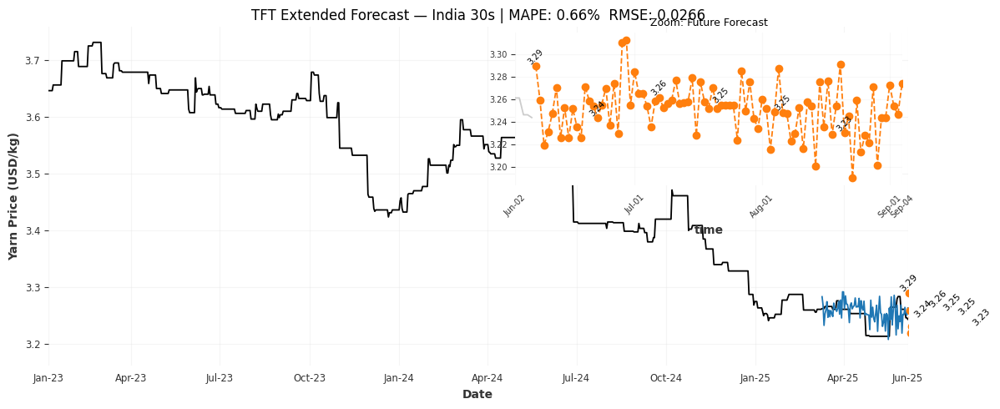

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores



🚀 Training TFT + future forecast for China 40s...


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


 China 40s: MAPE=0.85%, RMSE=0.0326


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

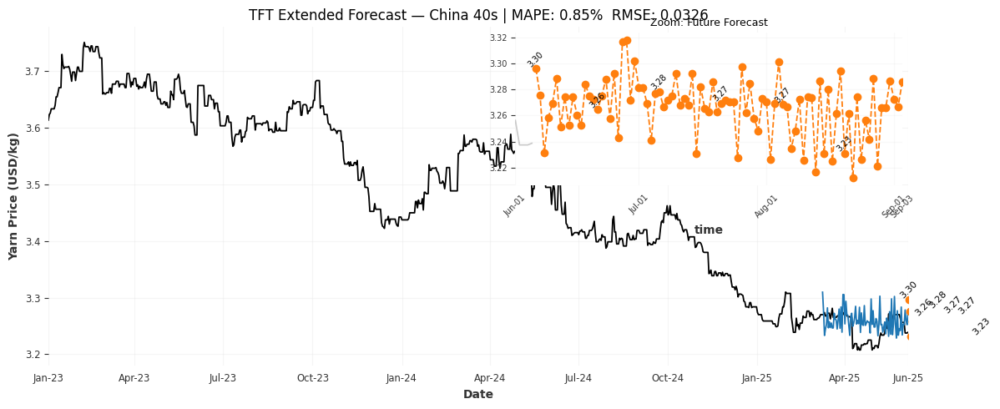


📄 Done. TFT trained and extended future forecasts plotted for all available subsets.


In [15]:
# # ============ 13) TFT Forecast  (India/China 30s/40s)  ============

# ========================
# 13.1 HELPER FUNCTIONS
# ========================
def extract_yarn_count(sub_product: str) -> float:
    s = str(sub_product)
    m = re.search(r'\b(\d{2})\b', s)
    if m: return float(m.group(1))
    m = re.search(r'\b(\d+)\s*/\s*\d+\b', s)
    if m and 10 <= int(m.group(1)) <= 99: return float(m.group(1))
    m = re.search(r'\bne[-\s]*(\d{2})\b', s, re.IGNORECASE)
    if m: return float(m.group(1))
    m = re.search(r'\b(\d{2})\s*[-x]\s*\d+\b', s, re.IGNORECASE)
    if m: return float(m.group(1))
    return np.nan

def ensure_count_col(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    if "Count" not in df.columns:
        df["Count"] = df["Sub Product"].apply(extract_yarn_count)
    return df

def daily_fill(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("daily_fill requires a DatetimeIndex")
    idx = pd.date_range(df.index.min(), df.index.max(), freq="D")
    return df.reindex(idx).ffill().bfill()

def build_market_count_daily(merged_daily: pd.DataFrame, market_kw: str, yarn_count: int) -> pd.DataFrame | None:
    if not {"Market", "Sub Product", "Yarn_price"}.issubset(merged_daily.columns):
        raise ValueError("merged_daily must contain: Market, Sub Product, Yarn_price")
    df = ensure_count_col(merged_daily)
    m_mask = df["Market"].astype(str).str.contains(market_kw, case=False, na=False)
    c_mask = df["Count"] == float(yarn_count)
    sub = df.loc[m_mask & c_mask].copy()
    if sub.empty:
        return None
    keep_cols = [c for c in ["Yarn_price","exchange_rate_numeric",
                             "raw_cotton_price","oil_price","labour_cost"]
                 if c in sub.columns]
    num_cols  = [c for c in keep_cols if sub[c].dtype != object]
    out = sub[num_cols].groupby(sub.index).mean().sort_index()
    out = out.replace([np.inf, -np.inf], np.nan)
    out = daily_fill(out).ffill().bfill()
    return out

# =======================
# 13.2  BUILD SUBSETS
# =======================
candidates = [
    ("India 30s",  "india", 30),
    ("India 40s",  "india", 40),
    ("China 30s",  "china", 30),
    ("China 40s",  "china", 40),
]

available: dict[str, pd.DataFrame] = {}
for name, mk, cnt in candidates:
    df_daily = build_market_count_daily(merged_daily, mk, cnt)
    if df_daily is not None and len(df_daily) > 0:
        available[name] = df_daily
        df_daily.to_csv(f"merged_daily_{name.lower().replace(' ', '_')}.csv")
        print(f"✅ Available: {name} (rows={len(df_daily)})")
    else:
        print(f" Skipped (no data): {name}")

if not available:
    raise RuntimeError("No available subsets among India/China × 30/40. Check your data.")

# ===============================
# 13.3 TFT MODEL FUNCTIONS
# ===============================
def tft_market_forecast(df_daily: pd.DataFrame,
                        target_col="Yarn_price",
                        cov_cols=("exchange_rate_numeric","raw_cotton_price",
                                  "oil_price","labour_cost"),
                        input_chunk_length=30,
                        output_chunk_length=14,
                        forecast_horizon=90,
                        epochs=100,
                        random_state=42):
    """
    Train TFT with price + covariates, evaluate on last `forecast_horizon` days.
    Returns inverse-scaled test and prediction series plus metrics.
    """
    # target series
    y = TimeSeries.from_dataframe(df_daily, value_cols=target_col,
                                  fill_missing_dates=True, freq="D")

    # covariates
    cov_cols = [c for c in cov_cols if c in df_daily.columns]
    cov = None
    if cov_cols:
        covs = [TimeSeries.from_dataframe(df_daily, value_cols=c,
                                          fill_missing_dates=True, freq="D")
                for c in cov_cols]
        cov = covs[0]
        for ts in covs[1:]:
            cov = cov.stack(ts)

    sy = Scaler(); ys = sy.fit_transform(y)
    scov = Scaler() if cov is not None else None
    covs_s = scov.fit_transform(cov) if cov is not None else None

    need = forecast_horizon + input_chunk_length + output_chunk_length + 5
    if len(ys) <= need:
        raise ValueError(f"Not enough rows ({len(ys)}) for horizon/chunks (need > {need}).")

    cutoff = ys.time_index[-forecast_horizon]
    y_tr, y_te = ys.split_after(cutoff)
    c_tr, c_te = (None, None)
    if covs_s is not None:
        c_tr, c_te = covs_s.split_after(cutoff)

        # pad covariates to cover encoder window
        def pad_cov(cov_ts, ref_ts, enc_len):
            required_start = ref_ts.start_time() - pd.Timedelta(days=enc_len)
            if cov_ts.start_time() > required_start:
                pad_len = (cov_ts.start_time() - required_start).days
                if pad_len > 0:
                    pad_vals = np.repeat(cov_ts.values()[0][np.newaxis, :],
                                         pad_len, axis=0)
                    pad_time = pd.date_range(end=cov_ts.start_time() - pd.Timedelta(days=1),
                                             periods=pad_len, freq=cov_ts.freq_str)
                    pad_series = TimeSeries.from_times_and_values(
                        pad_time, pad_vals, columns=cov_ts.components
                    )
                    cov_ts = pad_series.append(cov_ts)
            return cov_ts

        c_tr = pad_cov(c_tr, y_tr, input_chunk_length)
        c_te = pad_cov(c_te, y_te, input_chunk_length)

    model = TFTModel(
        input_chunk_length=input_chunk_length,
        output_chunk_length=output_chunk_length,
        hidden_size=32,
        lstm_layers=1,
        dropout=0.1,
        batch_size=16,
        n_epochs=epochs,
        add_relative_index=True,
        random_state=random_state,
    )

    model.fit(y_tr, past_covariates=c_tr, verbose=False)
    pred_s = model.predict(n=len(y_te), past_covariates=c_te)

    y_te_inv = sy.inverse_transform(y_te)
    pred_inv = sy.inverse_transform(pred_s)

    return {
        "y_test": y_te_inv,
        "y_pred": pred_inv,
        "mape": float(mape(y_te_inv, pred_inv)),
        "rmse": float(rmse(y_te_inv, pred_inv)),
        "scaler": sy,
        "full_series_scaled": ys,
    }

FUTURE_DAYS = 90
LABEL_EVERY = 15  # label every Nth day in future

def tft_future_only_forecast(full_scaled: TimeSeries,
                             scaler: Scaler,
                             target_col="Yarn_price",
                             input_chunk_length=30,
                             output_chunk_length=14,
                             epochs=100,
                             random_state=42):
    """
    Refit TFT on entire (scaled) target series only (univariate)
    and forecast FUTURE_DAYS ahead.
    """
    ys = full_scaled
    model = TFTModel(
        input_chunk_length=input_chunk_length,
        output_chunk_length=output_chunk_length,
        hidden_size=32,
        lstm_layers=1,
        dropout=0.1,
        batch_size=16,
        n_epochs=epochs,
        add_relative_index=True,
        random_state=random_state,
    )
    model.fit(ys, verbose=False)
    pred_future_s = model.predict(n=FUTURE_DAYS)
    pred_future   = scaler.inverse_transform(pred_future_s)
    y_all         = scaler.inverse_transform(ys)
    return y_all, pred_future

# =================================
# 13.4  Run TFT + plot future
# =================================
cfg = dict(input_chunk_length=30,
           output_chunk_length=14,
           forecast_horizon=90,
           epochs=100,
           random_state=42)

for name, df_daily in available.items():
    try:
        print(f"\n🚀 Training TFT + future forecast for {name}...")

        # test forecast with covariates
        res = tft_market_forecast(df_daily, **cfg)
        print(f" {name}: MAPE={res['mape']:.2f}%, RMSE={res['rmse']:.4f}")

        # extended future forecast (univariate, full series)
        y_all, pred_future = tft_future_only_forecast(
            res["full_series_scaled"], res["scaler"],
            target_col="Yarn_price",
            input_chunk_length=cfg["input_chunk_length"],
            output_chunk_length=cfg["output_chunk_length"],
            epochs=cfg["epochs"],
            random_state=cfg["random_state"],
        )

        # Convert to pandas
        hist_series   = y_all.pd_series()
        y_pred_series = res["y_pred"].pd_series()
        future_series = pred_future.pd_series()

        # ------------- Main Plot -------------
        fig, ax = plt.subplots(figsize=(12, 5))
        hist_series.plot(ax=ax, label="Actual (historical)", color="black")

        # overlay test forecast
        y_pred_series.plot(ax=ax, label="TFT Test Forecast", color="tab:blue")

        # future dotted forecast
        ax.plot(future_series.index, future_series.values, "o--",
                color="tab:orange", label=f"Future +{FUTURE_DAYS}d Forecast")

        # label future points
        for i in range(0, len(future_series), LABEL_EVERY):
            d = future_series.index[i]; v = future_series.iloc[i]
            ax.text(d, v, f"{v:.2f}", ha="center", va="bottom",
                    fontsize=8, rotation=45)

        ax.set_title(
            f"TFT Extended Forecast — {name} | "
            f"MAPE: {res['mape']:.2f}%  RMSE: {res['rmse']:.4f}"
        )
        ax.set_xlabel("Date"); ax.set_ylabel("Yarn Price (USD/kg)")
        ax.grid(True, alpha=0.3); ax.legend()
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y'))

        # ------------- Zoomed Inset -------------
        axins = inset_axes(ax, width="45%", height="45%", loc="upper right")
        zoom_start = future_series.index[0] - pd.Timedelta(days=5)
        zoom_end   = future_series.index[-1]
        hist_series.loc[zoom_start:].plot(ax=axins, color="grey", alpha=0.4)
        axins.plot(future_series.index, future_series.values, "o--",
                   color="tab:orange")
        for i in range(0, len(future_series), LABEL_EVERY):
            d = future_series.index[i]; v = future_series.iloc[i]
            axins.text(d, v, f"{v:.2f}", ha="center", va="bottom",
                       fontsize=7, rotation=45)
        axins.set_xlim(zoom_start, zoom_end)
        axins.set_title("Zoom: Future Forecast", fontsize=9)
        axins.grid(True, alpha=0.2)
        axins.xaxis.set_major_formatter(mdates.DateFormatter('%b-%d'))
        plt.setp(axins.get_xticklabels(), rotation=45, fontsize=7)
        plt.setp(axins.get_yticklabels(), fontsize=7)

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f" {name} failed: {e}")

print("\n📄 Done. TFT trained and extended future forecasts plotted for all available subsets.")


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores



🔍 IG based TFT interpretability for segment: India 30s


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

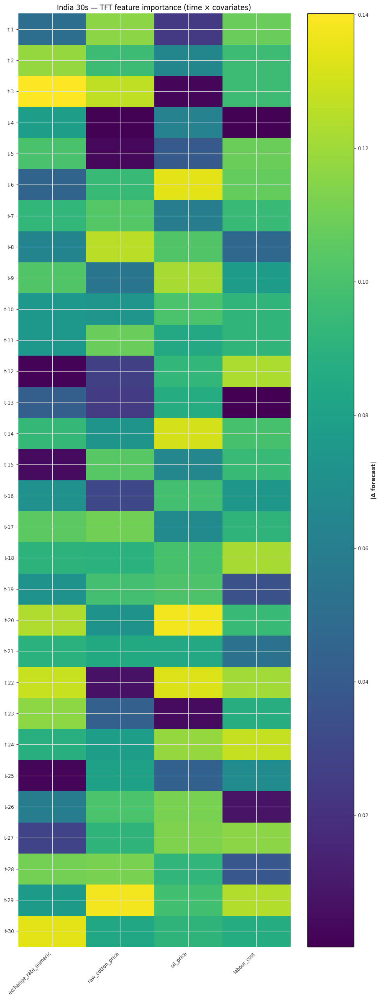

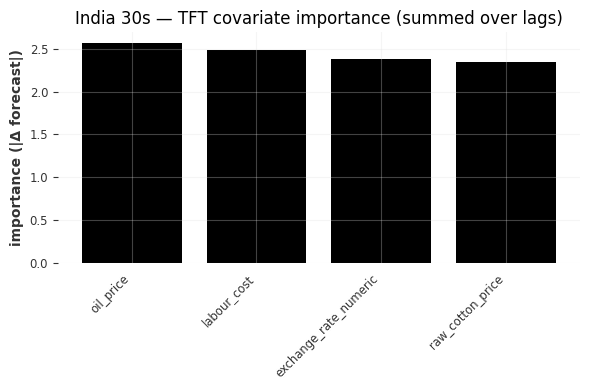

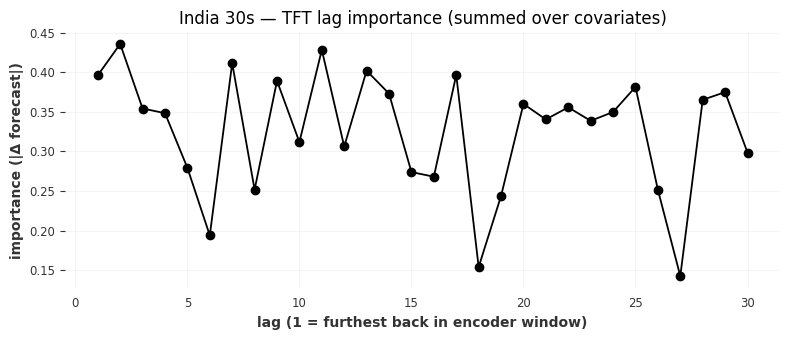

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores



Top 10 (lag × feature) contributions for India 30s:
01. lag=03 | feature=exchange_rate_numeric | importance=0.140176
02. lag=29 | feature=raw_cotton_price     | importance=0.137504
03. lag=20 | feature=oil_price            | importance=0.137447
04. lag=06 | feature=oil_price            | importance=0.134669
05. lag=30 | feature=exchange_rate_numeric | importance=0.134629
06. lag=22 | feature=oil_price            | importance=0.132629
07. lag=14 | feature=oil_price            | importance=0.130919
08. lag=22 | feature=exchange_rate_numeric | importance=0.128589
09. lag=24 | feature=labour_cost          | importance=0.127747
10. lag=03 | feature=raw_cotton_price     | importance=0.126912

🔍 IG based TFT interpretability for segment: China 40s


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Output()

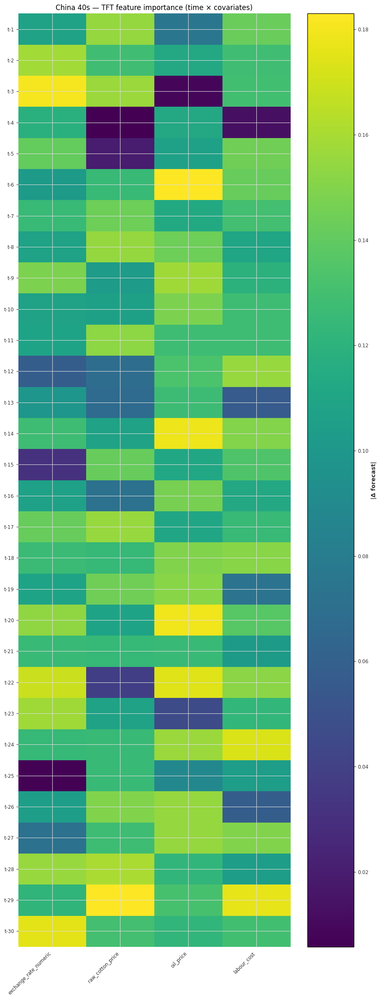

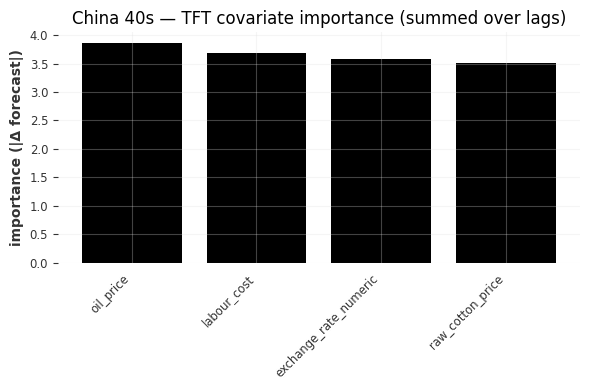

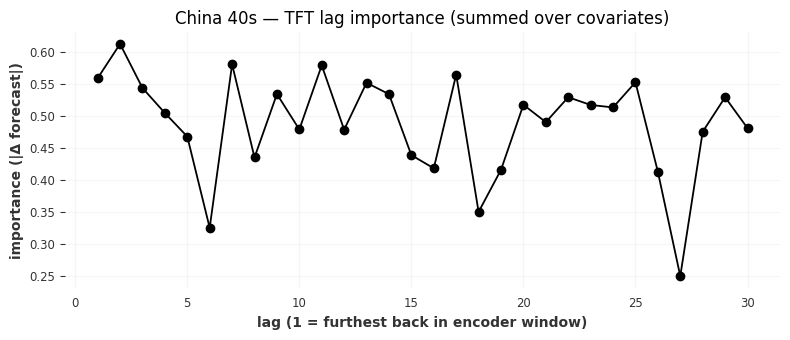


Top 10 (lag × feature) contributions for China 40s:
01. lag=29 | feature=raw_cotton_price     | importance=0.183015
02. lag=06 | feature=oil_price            | importance=0.182947
03. lag=03 | feature=exchange_rate_numeric | importance=0.180465
04. lag=20 | feature=oil_price            | importance=0.179333
05. lag=14 | feature=oil_price            | importance=0.178659
06. lag=29 | feature=labour_cost          | importance=0.176260
07. lag=30 | feature=exchange_rate_numeric | importance=0.176089
08. lag=22 | feature=oil_price            | importance=0.174327
09. lag=24 | feature=labour_cost          | importance=0.173028
10. lag=22 | feature=exchange_rate_numeric | importance=0.168787

✅ TFT interpretability (occlusion-based, IG-style) completed for selected segments.


In [17]:
# ============ 14) TFT IG Interpretability  ============

from copy import deepcopy

# Choose which TFT segments to explain
SEGMENTS_FOR_IG_TFT = ["India 30s", "China 40s"]  # must match keys in `available`

ENCODER_LEN_TFT = 30  # encoder window (must match input_chunk_length used in TFT)
IG_TOPK = 10          # how many (lag, feature) pairs to print

# 14.1 – Train TFT once per segment (price + covariates) and keep scaler & full covariates
def train_tft_for_ig_tft(df_daily,
                         target_col="Yarn_price",
                         cov_cols=("exchange_rate_numeric", "raw_cotton_price",
                                   "oil_price", "labour_cost"),
                         input_chunk_length=ENCODER_LEN_TFT,
                         output_chunk_length=14,
                         epochs=100,
                         random_state=42):
    """
    Fit TFT on full history (target + covariates).
    Returns:
      model      : fitted TFTModel
      ys         : scaled target TimeSeries
      covs_s     : scaled past covariates TimeSeries
      scaler_y   : Scaler for target
    """
    # Target
    y = TimeSeries.from_dataframe(df_daily, value_cols=target_col,
                                  fill_missing_dates=True, freq="D")

    # Covariates
    cov_cols = [c for c in cov_cols if c in df_daily.columns]
    cov = None
    if cov_cols:
        covs = [
            TimeSeries.from_dataframe(df_daily, value_cols=c,
                                      fill_missing_dates=True, freq="D")
            for c in cov_cols
        ]
        cov = covs[0]
        for ts in covs[1:]:
            cov = cov.stack(ts)

    # Scale
    sy = Scaler()
    ys = sy.fit_transform(y)
    scov = Scaler() if cov is not None else None
    covs_s = scov.fit_transform(cov) if cov is not None else None

    # Build TFT
    model = TFTModel(
        input_chunk_length=input_chunk_length,
        output_chunk_length=output_chunk_length,
        hidden_size=32,
        lstm_layers=1,
        dropout=0.1,
        batch_size=16,
        n_epochs=epochs,
        add_relative_index=True,
        random_state=random_state,
    )

    # Fit on full history
    model.fit(ys, past_covariates=covs_s, verbose=False)

    return dict(
        model=model,
        ys=ys,
        covs_s=covs_s,
        scaler_y=sy,
        input_chunk_length=input_chunk_length,
        cov_col_names=cov_cols
    )

# 14.2 – Helper: one-step forecast given modified covariate values
def _single_step_forecast_with_cov(model, ys, cov_values, cov_components):
    """
    Given:
      ys           : scaled target TimeSeries (full history)
      cov_values   : numpy array [T, F] of scaled covariate values (full history)
      cov_components : list of covariate component names
    Returns: float single-step forecast (in ORIGINAL scale)
    """
    # Rebuild covariate TimeSeries from modified values
    cov_ts = TimeSeries.from_times_and_values(
        ys.time_index, cov_values, columns=cov_components
    )

    # TFTModel.predict expects `series=ys` and `past_covariates=cov_ts`
    pred_scaled = model.predict(n=1, series=ys, past_covariates=cov_ts)
    # pred_scaled is a scaled TimeSeries → return scalar (still scaled)
    return float(pred_scaled.values()[0, 0])

# 14.3 –IG Based attribution for one segment
def ig_style_attribution_for_segment_tft(name, df_daily):
    """
    For a given segment:
      1) Train TFT on full history.
      2) Take last ENCODER_LEN_TFT days of covariates.
      3) Occlude each (lag, feature) by replacing with baseline (time-mean),
         recompute forecast, and measure |Δ prediction|.
      4) Return heatmap [lag, feature], per-feature sums, and plots.
    """
    print(f"\n🔍 IG based TFT interpretability for segment: {name}")

    cfg_tft = dict(
        input_chunk_length=ENCODER_LEN_TFT,
        output_chunk_length=14,
        epochs=100,
        random_state=42,
    )

    # ---- Train TFT (full history) ----
    info = train_tft_for_ig_tft(df_daily, **cfg_tft)
    model      = info["model"]
    ys         = info["ys"]
    covs_s     = info["covs_s"]
    cov_names  = info["cov_col_names"]

    if covs_s is None or len(cov_names) == 0:
        print("ℹ️ No covariates found; cannot compute covariate attributions.")
        return None

    # Full covariate values (scaled)
    cov_vals_full = covs_s.values(copy=True)    # shape [T, F]
    T, F = cov_vals_full.shape
    L = min(ENCODER_LEN_TFT, T)

    # Window indices for encoder (last L days)
    idx_start = T - L
    idx_end   = T
    window_idx = np.arange(idx_start, idx_end)

    # Baseline = time-mean of each feature over full history
    baseline_vec = cov_vals_full.mean(axis=0)   # shape [F]

    # --- Baseline forecast (no occlusion) ---
    base_cov_vals = cov_vals_full.copy()
    base_pred_scaled = _single_step_forecast_with_cov(
        model, ys, base_cov_vals, covs_s.components
    )



    # --- Importance matrix [L, F] ---
    importance = np.zeros((L, F), dtype=float)

    for l in range(L):
        for j in range(F):
            # Copy full cov matrix
            cov_occluded = cov_vals_full.copy()
            # Replace that single (lag, feature) with baseline
            cov_occluded[idx_start + l, j] = baseline_vec[j]

            # Forecast with this perturbation
            pred_occ_scaled = _single_step_forecast_with_cov(
                model, ys, cov_occluded, covs_s.components
            )

            # Importance = absolute change in prediction
            importance[l, j] = abs(base_pred_scaled - pred_occ_scaled)

    # Flip lag axis so "lag 1" is most recent
    importance_flipped = importance[::-1, :]   # [lag_from_now, feature]

    # Aggregate
    per_feature = importance_flipped.sum(axis=0)
    per_lag     = importance_flipped.sum(axis=1)

    # ---- Plot heatmap ----
    seq_len = importance_flipped.shape[0]

    plt.figure(figsize=(1.3*F + 4, 0.7*seq_len + 3))
    plt.imshow(importance_flipped, aspect="auto", origin="lower")
    plt.colorbar(label="|Δ forecast|")
    plt.yticks(
        range(seq_len),
        [f"t-{k}" for k in range(seq_len, 0, -1)]
    )
    plt.xticks(range(F), cov_names, rotation=45, ha="right")
    plt.title(f"{name} — TFT feature importance (time × covariates)")
    plt.tight_layout()
    plt.show()

    # ---- Per-feature bar plot ----
    order = np.argsort(per_feature)[::-1]
    plt.figure(figsize=(max(6, 1.2*F), 4))
    plt.bar(np.array(cov_names)[order], per_feature[order])
    plt.title(f"{name} — TFT covariate importance (summed over lags)")
    plt.ylabel("importance (|Δ forecast|)")
    plt.xticks(rotation=45, ha="right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # ---- Per-lag line plot ----
    plt.figure(figsize=(8, 3.5))
    plt.plot(range(1, seq_len+1), per_lag, marker="o")
    plt.title(f"{name} — TFT lag importance (summed over covariates)")
    plt.xlabel("lag (1 = furthest back in encoder window)")
    plt.ylabel("importance (|Δ forecast|)")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # ---- Print top-K (lag, feature) pairs ----
    print(f"\nTop {IG_TOPK} (lag × feature) contributions for {name}:")
    pairs = []
    for l in range(seq_len):
        for j, fname in enumerate(cov_names):
            pairs.append((importance_flipped[l, j], l, fname))
    pairs.sort(reverse=True, key=lambda x: x[0])

    for i, (val, l, fname) in enumerate(pairs[:IG_TOPK], 1):
        print(f"{i:02d}. lag={seq_len - l:02d} | feature={fname:<20} | importance={val:.6f}")

    return dict(
        importance=importance_flipped,
        per_feature=per_feature,
        per_lag=per_lag,
        cov_names=cov_names,
        base_pred_scaled=base_pred_scaled,
    )

# 14.4 – Run for the two chosen segments
ig_results_tft = {}

for seg_name in SEGMENTS_FOR_IG_TFT:
    if seg_name not in available:
        print(f"ℹ️ Segment '{seg_name}' not found in `available` (skipping).")
        continue

    df_seg_daily = available[seg_name]
    ig_results_tft[seg_name] = ig_style_attribution_for_segment_tft(seg_name, df_seg_daily)

print("\n✅ TFT interpretability (occlusion-based, IG-style) completed for selected segments.")
